We'll follow the formula below for building up basis functions (from 0th to 3rd degree)
![image.png](degree3.jpg)

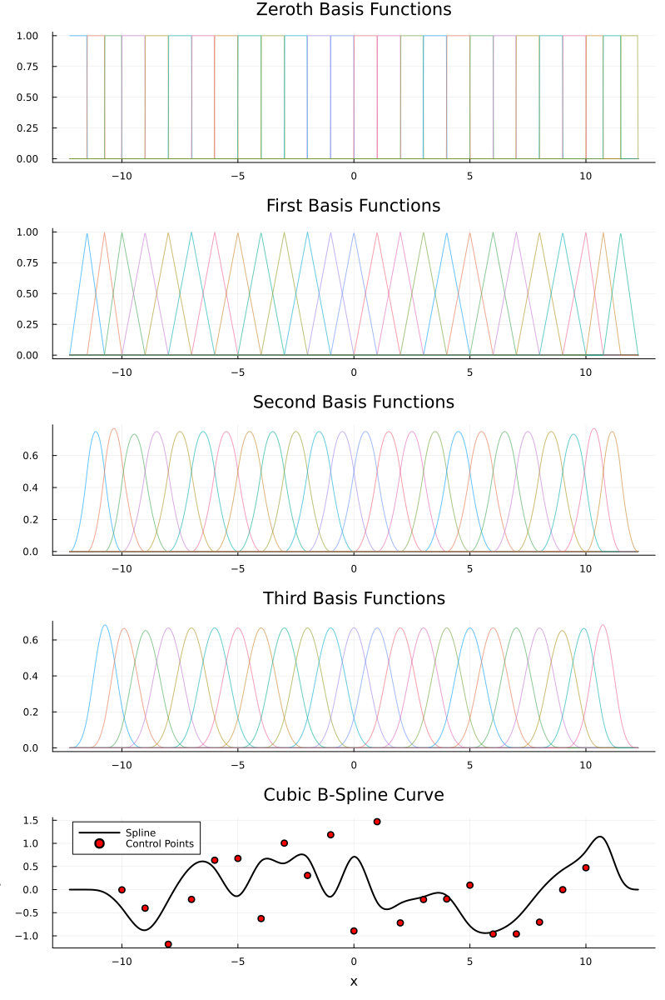

In [1]:
using Plots
using LinearAlgebra

struct BSpline3
    grid_knots::Vector{Float64}  # size must be n + 2 * k + 1, where k = 3 for cubic
    ctrl_points::Vector{Float64}  # size must be n + k
end

function BSpline3(lb::Float64, ub::Float64; n::Int = 20)
    k = 3  # degree 3 for cubic spline
    # control points -- initialize randomly
    cpoints::Vector{Float64} = randn(Float64, n+k)
    grid_pts::Vector{Float64} = LinRange(lb, ub, n+1)
    # add 3 points before lower bound and 3 points after upper bound (k=3)
    pushfirst!(grid_pts, lb-0.75)
    pushfirst!(grid_pts, lb-1.5)
    pushfirst!(grid_pts, lb-2.25)
    push!(grid_pts, ub+0.75)
    push!(grid_pts, ub+1.5)
    push!(grid_pts, ub+2.25)
    BSpline3(grid_pts, cpoints)
end

function basis3(bs::BSpline3, x::Float64)
    n = size(bs.grid_knots)[1] - 1
    
    # zeroth basis function (piecewise constant)
    b0::Vector{Float64} = (x .>= bs.grid_knots[1:end-1]) .& (x .< bs.grid_knots[2:end])
    
    # first basis functions (piecewise linear)
    b1_numerator_left = x .- bs.grid_knots[1:end-2]
    b1_denominator_left = bs.grid_knots[2:end-1] .- bs.grid_knots[1:end-2]
    b1_numerator_right = bs.grid_knots[3:end] .- x  
    b1_denominator_right = bs.grid_knots[3:end] .- bs.grid_knots[2:end-1]
    
    b1::Vector{Float64} = (b1_numerator_left ./ b1_denominator_left) .* b0[1:end-1] + 
                         (b1_numerator_right ./ b1_denominator_right) .* b0[2:end]
    
    # second basis functions (piecewise quadratic)
    b2_numerator_left = x .- bs.grid_knots[1:end-3]
    b2_numerator_right = bs.grid_knots[4:end] .- x  
    b2_denominator_left = bs.grid_knots[3:end-1] .- bs.grid_knots[1:end-3] 
    b2_denominator_right = bs.grid_knots[4:end] .- bs.grid_knots[2:end-2]
    
    b2::Vector{Float64} = (b2_numerator_left ./ b2_denominator_left) .* b1[1:end-1] + 
                         (b2_numerator_right ./ b2_denominator_right) .* b1[2:end]
    
    # third basis functions (piecewise cubic)
    b3_numerator_left = x .- bs.grid_knots[1:end-4]
    b3_numerator_right = bs.grid_knots[5:end] .- x
    b3_denominator_left = bs.grid_knots[4:end-1] .- bs.grid_knots[1:end-4]
    b3_denominator_right = bs.grid_knots[5:end] .- bs.grid_knots[2:end-3]
    
    b3::Vector{Float64} = (b3_numerator_left ./ b3_denominator_left) .* b2[1:end-1] + 
                         (b3_numerator_right ./ b3_denominator_right) .* b2[2:end]
    
    return b0, b1, b2, b3
end

function eval_cubic_spline(bs::BSpline3, x)
    _, _, _, b3 = basis3(bs, x)
    b3 ⋅ bs.ctrl_points
end

function plot_cubic_bspline_with_basis()
    # Create a B-spline of degree 3
    bs = BSpline3(-10.0, 10.0)  # fewer control points for clarity
    
    # Create range of x values for plotting
    x_range = LinRange(minimum(bs.grid_knots), maximum(bs.grid_knots), 1000)
    
    # Calculate basis functions for visualization
    b0_values = zeros(length(x_range), length(bs.grid_knots)-1)
    b1_values = zeros(length(x_range), length(bs.grid_knots)-2)
    b2_values = zeros(length(x_range), length(bs.grid_knots)-3)
    b3_values = zeros(length(x_range), length(bs.grid_knots)-4)
    spline_values = zeros(length(x_range))
    
    # Calculate basis functions and spline values for each x
    for (i, x) in enumerate(x_range)
        b0, b1, b2, b3 = basis3(bs, x)
        b0_values[i, :] = b0
        b1_values[i, :] = b1
        b2_values[i, :] = b2
        b3_values[i, :] = b3
        spline_values[i] = eval_cubic_spline(bs, x)
    end
    
    # Create subplots for all basis functions
    p1 = plot(title="Zeroth Basis Functions", legend=false)
    for i in 1:size(b0_values, 2)
        plot!(p1, x_range, b0_values[:, i], linealpha=0.6)
    end
    
    p2 = plot(title="First Basis Functions", legend=false)
    for i in 1:size(b1_values, 2)
        plot!(p2, x_range, b1_values[:, i], linealpha=0.6)
    end
    
    p3 = plot(title="Second Basis Functions", legend=false)
    for i in 1:size(b2_values, 2)
        plot!(p3, x_range, b2_values[:, i], linealpha=0.6)
    end
    
    p4 = plot(title="Third Basis Functions", legend=false)
    for i in 1:size(b3_values, 2)
        plot!(p4, x_range, b3_values[:, i], linealpha=0.6)
    end
    
    # Create subplot for the resulting spline
    p5 = plot(title="Cubic B-Spline Curve",
             xlabel="x",
             ylabel="y")
    
    # Plot the spline
    plot!(p5, x_range, spline_values, 
          label="Spline",
          color=:black,
          linewidth=2)
    
    # Add control points
    scatter!(p5, bs.grid_knots[4:end-3], bs.ctrl_points,
            label="Control Points",
            color=:red,
            markersize=4)
    
    # Combine plots
    plot(p1, p2, p3, p4, p5, layout=(5,1), size=(800,1200))
end

# Generate and display the plot
plot_cubic_bspline_with_basis()

Execution time:
  0.005647 seconds (144 allocations: 6.047 KiB, 99.00% compilation time)


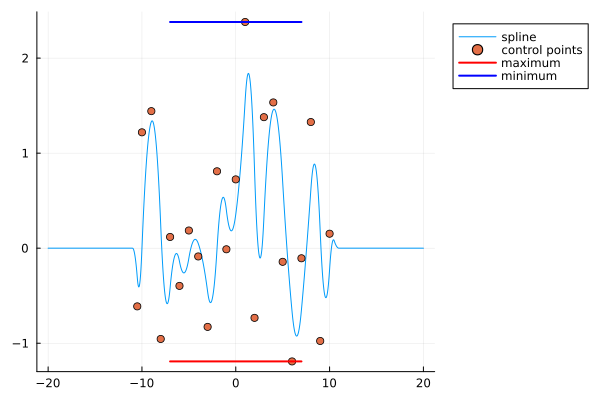

In [2]:
struct BSpline2
    grid_knots::Vector{Float64} # size must be n + 2 * k + 1
    ctrl_points::Vector{Float64} # size must be n + k 
end

function BSpline2(lb::Float64, ub::Float64; n::Int = 20)
    k = 2
    cpoints::Vector{Float64} = randn(Float64, n+k)
    grid_pts::Vector{Float64} = LinRange(lb, ub, n+1)
    pushfirst!(grid_pts, lb-0.5)
    pushfirst!(grid_pts, lb-1.0)
    push!(grid_pts, ub + 0.5)
    push!(grid_pts, ub + 1.0)
    BSpline2( grid_pts, cpoints)
end

function basis2(bs::BSpline2, x::Float64)
    n = size(bs.grid_knots)[1] - 1
    # these are the zeroth basis function
    b0::Vector{Float64} = (x .>= bs.grid_knots[1:end-1]) .& (x .< bs.grid_knots[2:end]) # piecewise constant
    # calculate the first basis functions
    b1_numerator_left = x .-  bs.grid_knots[1:end-2]
    b1_denominator_left = bs.grid_knots[2:end-1] .- bs.grid_knots[1:end-2]
    b1_numerator_right = bs.grid_knots[3:end] .- x  
    b1_denominator_right = bs.grid_knots[3:end]  .- bs.grid_knots[2:end-1]
     # piecewise linear functions
    b1::Vector{Float64} = (b1_numerator_left ./ b1_denominator_left) .* b0[1:end-1] + (b1_numerator_right ./ b1_denominator_right) .* b0[2:end]
    # calculate the second basis functions
    b2_numerator_left = x .- bs.grid_knots[1:end-3]
    b2_numerator_right = bs.grid_knots[4:end] .- x  
    b2_denominator_left = bs.grid_knots[3:end-1] .- bs.grid_knots[1:end-3] 
    b2_denominator_right = bs.grid_knots[4:end] .- bs.grid_knots[2:end-2]
     #piecewise quadratic functions.
    b2::Vector{Float64} = (b2_numerator_left ./ b2_denominator_left) .* b1[1:end-1] + (b2_numerator_right ./ b2_denominator_right) .* b1[2:end]
    return b2
 end

function eval_spline(bs::BSpline2, x)
    b2 = basis2(bs, x)
    b2 ⋅ bs.ctrl_points
 end

function int_analysis_convex_hull(bs::BSpline2, interval_start::Float64, interval_end::Float64)
    in_interval = []
    for i in 1:length(bs.ctrl_points)
        if interval_start <= bs.grid_knots[i+2] <= interval_end
            push!(in_interval, i)
        end
    end
    first_point = minimum(in_interval) - 1
    last_point = maximum(in_interval) + 1
    return minimum(bs.ctrl_points[first_point:last_point]), maximum(bs.ctrl_points[first_point:last_point])
end

bs = BSpline2(-10.0, 10.0)
x_full = LinRange(-20.0, 20.0, 1000)
y_full = [eval_spline(bs, x_elt) for x_elt in x_full]
x_min, x_max = -7.0, 7.0
println("Execution time:")
@time max_y, min_y = int_analysis_convex_hull(bs, -7.0, 7.0)
p = plot(x_full, y_full, label="spline", legend=:outertopright)
scatter!(bs.grid_knots[2:end-2], bs.ctrl_points, label="control points")
plot!([x_min, x_max], [max_y, max_y], color=:red, label="maximum", linewidth=2)
plot!([x_min, x_max], [min_y, min_y], color=:blue, label="minimum", linewidth=2)

Now we'll clean everything up. Below are functions capable of generating B-Splines of any degree

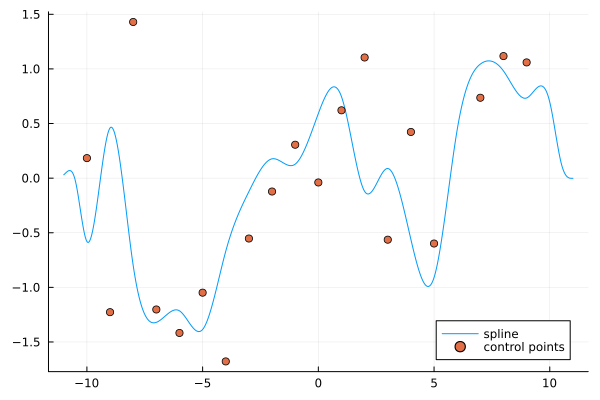

In [3]:
using LinearAlgebra
using Plots
using Random

struct BSpline
    grid_knots::Vector{Float64}
    ctrl_points::Vector{Float64}
    degree::Int
end

function BSpline(lb::Float64, ub::Float64, degree::Int; n::Int = 20, rng::AbstractRNG=Random.GLOBAL_RNG)
    k = degree
    cpoints::Vector{Float64} = randn(rng, Float64, n+k)  # Use provided RNG
    grid_pts::Vector{Float64} = LinRange(lb, ub, n+1)
    
    # Add k points before and after the bounds
    for i in 1:k
        pushfirst!(grid_pts, lb - (i * (ub-lb)/(2n)))
        push!(grid_pts, ub + (i * (ub-lb)/(2n)))
    end
    
    BSpline(grid_pts, cpoints, k)
end

function basis(bs::BSpline, x::Float64)
    n = size(bs.grid_knots)[1] - 1
    k = bs.degree
    # Initialize basis functions array for all degrees
    b = Vector{Vector{Float64}}(undef, k+1)
    # zeroth basis function (piecewise constant)
    b[1] = (x .>= bs.grid_knots[1:end-1]) .& (x .< bs.grid_knots[2:end])
    
    # compute basis functions for degrees 1 to k
    for degree in 1:k
        b[degree+1] = zeros(Float64, n-degree)
        for i in 1:(n-degree)
            numerator_left = x - bs.grid_knots[i]
            numerator_right = bs.grid_knots[i+degree+1] - x
            denominator_left = bs.grid_knots[i+degree] - bs.grid_knots[i]
            denominator_right = bs.grid_knots[i+degree+1] - bs.grid_knots[i+1]
            b[degree+1][i] = (numerator_left ./ denominator_left) .* b[degree][i] + (numerator_right ./ denominator_right) .* b[degree][i+1]
        end
    end
    
    return b
end

function eval_spline(bs::BSpline, x)
    b = basis(bs, x)[bs.degree+1]
    b ⋅ bs.ctrl_points
end

bs = BSpline(-10.0, 10.0, 3)
x = LinRange(-11.0, 11.0, 1000)
y = [eval_spline(bs, x_elt) for x_elt in x]
plot(x, y, label="spline")
scatter!(bs.grid_knots[bs.degree+1:end-bs.degree-1], bs.ctrl_points, label="control points")

We'll follow the formula below for computing the 1st derivative:
![image.png](derivative.jpg)

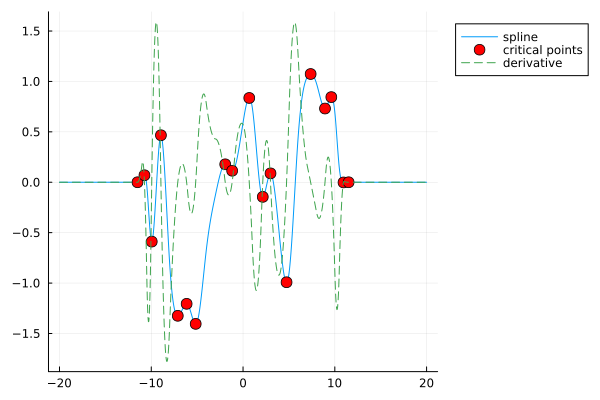

In [4]:
function basis_derivative(bs::BSpline, x::Float64)
    n = size(bs.grid_knots)[1] - 1
    k = bs.degree
    b = basis(bs, x)
    # Initialize derivative arrays for all degrees
    d = Vector{Vector{Float64}}(undef, k+1)
    # derivative of degree 0 is zero everywhere
    d[1] = zeros(Float64, n)

    for degree in 1:k
        d[degree+1] = zeros(Float64, n-degree)
        for i in 1:(n-degree)
            term1 = b[degree][i] / (bs.grid_knots[i+degree] - bs.grid_knots[i])
            term2 = b[degree][i+1] / (bs.grid_knots[i+degree+1] - bs.grid_knots[i+1])
            d[degree+1][i] = degree * (term1 - term2)
        end
    end
    return d
end

function eval_derivative(bs::BSpline, x::Float64)
    d = basis_derivative(bs, x)[bs.degree+1]
    return d ⋅ bs.ctrl_points
end

function plot_spline_with_derivative(bs::BSpline, x)
    y = [eval_spline(bs, x_elt) for x_elt in x]
    dy = [eval_derivative(bs, x_elt) for x_elt in x]
    p1 = plot(x, y, label="spline", title="B-spline")
    scatter!(p1, bs.grid_knots[bs.degree+1:end-bs.degree-1], bs.ctrl_points, label="control points")
    p2 = plot(x, dy, label="derivative", title="B-spline derivative")
    plot(p1, p2, layout=(2,1))
end

function find_critical_points(bs::BSpline, tolerance::Float64=1e-6)
    x = LinRange(-20.0, 20.0, 10000)
    y_deriv = [eval_derivative(bs, x_i) for x_i in x]
    sign_changes = Float64[]
    for i in 1:(length(y_deriv)-1)
        if sign(y_deriv[i+1]) != sign(y_deriv[i])
            push!(sign_changes, x[i+1])
        end
    end
    return sign_changes
end

critical_points = find_critical_points(bs)

x = LinRange(-20.0, 20.0, 1000)
y = [eval_spline(bs, x_elt) for x_elt in x]
crit_points = find_critical_points(bs)
crit_values = [eval_spline(bs, x) for x in crit_points]
p = plot(x, y, label="spline", legend=:outertopright)
scatter!(crit_points, crit_values, color=:red, 
        markersize=6, label="critical points")
y_deriv = [eval_derivative(bs, x_elt) for x_elt in x]
plot!(x, y_deriv, label="derivative", linestyle=:dash)


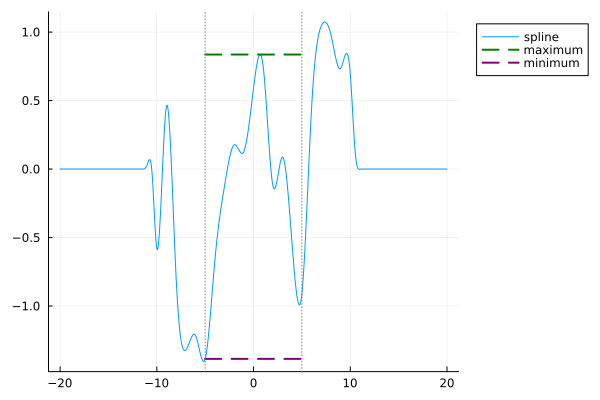

In [5]:
function interval_analysis_spline(bs::BSpline, x_min::Float64, x_max::Float64)
      x = LinRange(x_min, x_max, 1000)
      y = [eval_spline(bs, x_elt) for x_elt in x]
      crit_points = find_critical_points(bs)
      crit_values = Float64[]
      push!(crit_values, eval_spline(bs, x_min))
      push!(crit_values, eval_spline(bs, x_max))
      for x in crit_points
          if x > x_min && x < x_max
              push!(crit_values, eval_spline(bs, x))
          end
      end
      max_y, min_y = maximum(crit_values), minimum(crit_values)
      return max_y, min_y
  end

x_min, x_max = -5.0, 5.0
max_y, min_y = interval_analysis_spline(bs, x_min, x_max)
p = plot(x, y, label="spline", legend=:outertopright)
plot!([x_min, x_max], [max_y, max_y], color=:green, 
      label="maximum", linewidth=2, linestyle=:dash)
plot!([x_min, x_max], [min_y, min_y], color=:purple, 
      label="minimum", linewidth=2, linestyle=:dash)
vline!(p, [x_min, x_max], 
      color=:gray, 
      linestyle=:dot, 
      label=false)
return p

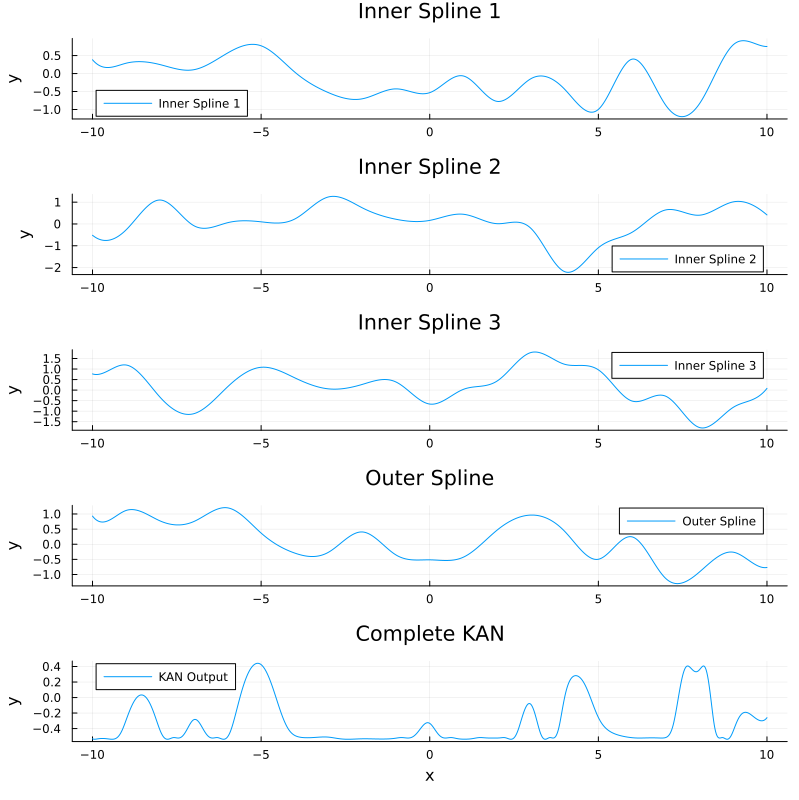

In [6]:
struct KAN
    inner_splines::Vector{BSpline}
    outer_spline::BSpline
end


function KAN(n_inner::Int=3; seed::Int=42)
    rng = Random.MersenneTwister(seed)
    inner_splines = [BSpline(-10.0, 10.0, 3, rng=rng) for _ in 1:n_inner]
    outer_spline = BSpline(-10.0, 10.0, 3, rng=rng)
    KAN(inner_splines, outer_spline)
end

function (kan::KAN)(x::Float64)
    # Evaluate KAN at point x (Sum inner values and evaluate through outer spline)
    inner_values = [eval_spline(spline, x) for spline in kan.inner_splines]
    inner_sum = sum(inner_values)
    return eval_spline(kan.outer_spline, inner_sum)
end

x_range = LinRange(-10, 10, 1000)
kan = KAN(3) # Make a KAN with 3 inner splines
kan_values = [kan(x) for x in x_range]
p = plot(layout=(5,1), size=(800,800))
for (i, spline) in enumerate(kan.inner_splines)
    inner_values = [eval_spline(spline, x) for x in x_range]
    plot!(p[i], x_range, inner_values, 
          label="Inner Spline $i", 
          title="Inner Spline $i",
          ylabel="y")
end
outer_values = [eval_spline(kan.outer_spline, x) for x in x_range]
plot!(p[4], x_range, outer_values, 
      label="Outer Spline", 
      title="Outer Spline",
      ylabel="y")
plot!(p[5], x_range, kan_values, 
      label="KAN Output", 
      title="Complete KAN",
      xlabel="x",
      ylabel="y")
display(p)

Output is guaranteed to be in [-0.5375168106088759, 0.18700724821656625]


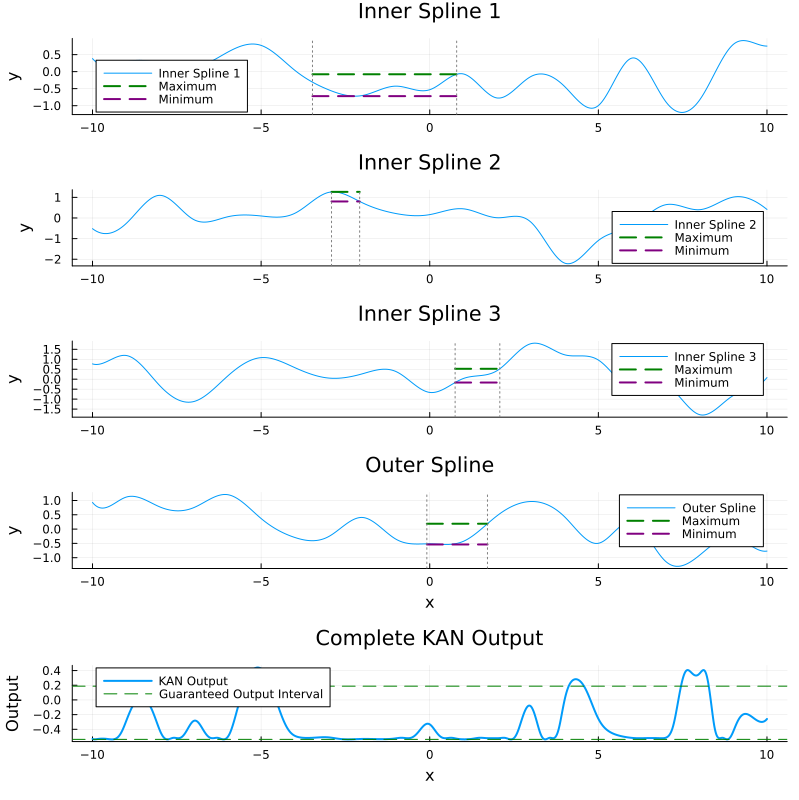

In [7]:
function kan_interval_analysis_vanilla(x_range, kan)
    p1 = plot(layout=(5,1), size=(800,800))
    inner_intervals = Vector{Tuple{Float64, Float64}}()
    for (i, spline) in enumerate(kan.inner_splines)
          width = rand() * 4 + 0.5
          placer = 7 - rand() * 14
          x_min, x_max = placer - 0.5 * width, placer + 0.5 * width
          max_y, min_y = interval_analysis_spline(spline, x_min, x_max)
          push!(inner_intervals, (min_y, max_y))
          inner_values = [eval_spline(spline, x) for x in x_range]
          plot!(p1[i], x_range, inner_values,
                label="Inner Spline $i",
                title="Inner Spline $i",
                ylabel="y")
          plot!(p1[i], [x_min, x_max], [max_y, max_y],
                color=:green,
                label="Maximum",
                linewidth=2,
                linestyle=:dash)
          plot!(p1[i], [x_min, x_max], [min_y, min_y],
                color=:purple,
                label="Minimum",
                linewidth=2,
                linestyle=:dash)
          vline!(p1[i], [x_min, x_max], 
                color=:gray, 
                linestyle=:dot, 
                label=false)
    end

    sum_min = sum(interval[1] for interval in inner_intervals)
    sum_max = sum(interval[2] for interval in inner_intervals)
    outer_max, outer_min = interval_analysis_spline(kan.outer_spline, sum_min, sum_max)
    inner_values = [eval_spline(kan.outer_spline, x) for x in x_range]
    plot!(p1[4], x_range, inner_values, 
          label="Outer Spline", 
          title="Outer Spline",
          xlabel="x",
          ylabel="y")
    plot!(p1[4], [sum_min, sum_max], [outer_max, outer_max],
            color=:green,
            label="Maximum",
            linewidth=2,
            linestyle=:dash)
    plot!(p1[4], [sum_min, sum_max], [outer_min, outer_min],
            color=:purple,
            label="Minimum",
            linewidth=2,
            linestyle=:dash)
    vline!(p1[4], [sum_min, sum_max], 
          color=:gray, 
          linestyle=:dot, 
          label=false)

      kan_vals = [kan(x) for x in x_range]
      plot!(p1[5], x_range, kan_vals, 
            label="KAN Output", 
            linewidth=2)
      hline!(p1[5], [outer_max, outer_min], 
            color=:green, 
            linestyle=:dash, 
            label="Guaranteed Output Interval")
      title!(p1[5], "Complete KAN Output")
      xlabel!(p1[5], "x")
      ylabel!(p1[5], "Output")
    return p1, (outer_min, outer_max)
end

x_range = LinRange(-10, 10, 1000)
p, (outer_min, outer_max) = kan_interval_analysis_vanilla(x_range, kan)
println("Output is guaranteed to be in [$(outer_min), $(outer_max)]")
display(p)

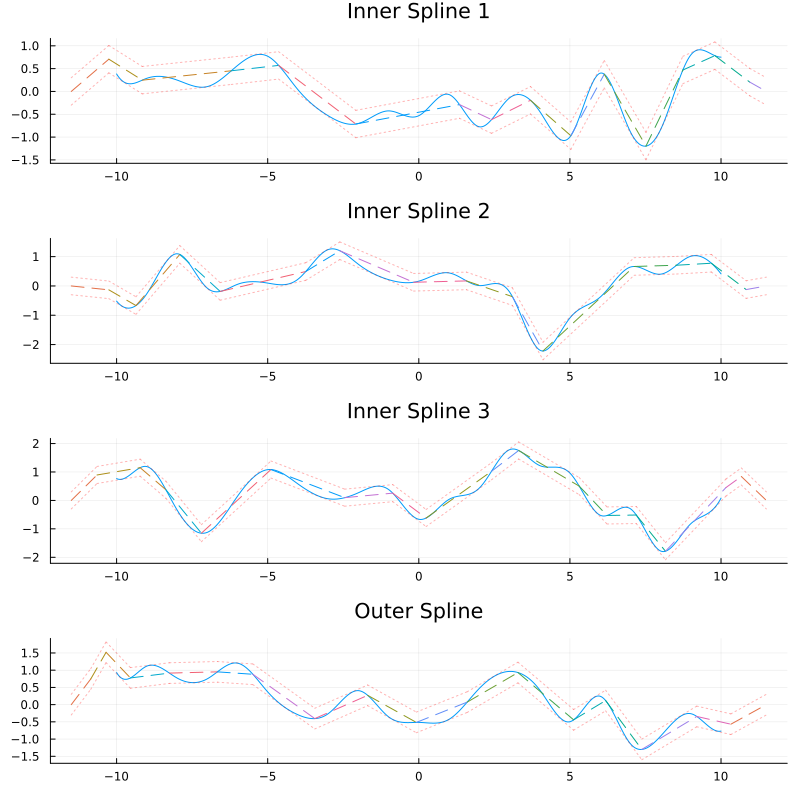

In [8]:
using JuMP
using Plots
using LinearAlgebra

function fit_line_through_points(x1::Float64, y1::Float64, x2::Float64, y2::Float64)
    slope = (y2 - y1) / (x2 - x1)
    intercept = y1 - slope * x1
    return slope, intercept
end

function compute_max_error(x_points::Vector{Float64}, y_points::Vector{Float64}, slope::Float64, intercept::Float64)
    y_predicted = slope .* x_points .+ intercept
    return maximum(abs.(y_predicted - y_points))
end

function find_bspline_segments_given_max_error(bs::BSpline, max_error::Float64, min_x::Float64, max_x::Float64)
    n_samples = 1000
    x_points = LinRange(min_x, max_x, n_samples)
    y_points = [eval_spline(bs, x) for x in x_points]
    segments = Tuple{Float64, Float64, Float64, Float64}[]  # (start_x, end_x, slope, intercept)
    
    start_idx = 1
    start_x = x_points[1]
    start_y = y_points[1]
    while start_idx < n_samples
        # Try to extend segment as far as possible
        end_idx = start_idx + 1
        last_valid_slope = 0.0
        last_valid_intercept = 0.0
        while end_idx <= n_samples
            next_x = x_points[end_idx]
            next_y = y_points[end_idx]
            current_slope, current_intercept = fit_line_through_points(start_x, start_y, next_x, next_y)
            # Check error
            x_segment = x_points[start_idx:end_idx]
            y_segment = y_points[start_idx:end_idx]
            error = compute_max_error(Vector(x_segment), Vector(y_segment), current_slope, current_intercept)
            if error > max_error && end_idx > start_idx + 1
                end_idx -= 1
                next_x = x_points[end_idx]
                next_y = y_points[end_idx]
                last_valid_slope, last_valid_intercept = fit_line_through_points(start_x, start_y, next_x, next_y)
                break
            elseif error > max_error
                # Need at least two points, force accept
                end_idx = start_idx + 1
                next_x = x_points[end_idx]
                next_y = y_points[end_idx]
                last_valid_slope, last_valid_intercept = fit_line_through_points(start_x, start_y, next_x, next_y)
                break
            elseif end_idx == n_samples
                last_valid_slope = current_slope
                last_valid_intercept = current_intercept
                break
            end

            last_valid_slope = current_slope
            last_valid_intercept = current_intercept
            end_idx += 1
        end

        push!(segments, (start_x, x_points[end_idx], last_valid_slope, last_valid_intercept))
        start_idx = end_idx
        start_x = x_points[end_idx]
        start_y = y_points[end_idx]
    end

    return segments
end

struct DynamicSplineApproximation
    segments::Vector{Tuple{Float64, Float64, Float64, Float64}}  # (start_x, end_x, slope, intercept)
    max_error::Float64
end

# output B-Splines with segments fitted to them
function fit_bspline_segments_given_max_error(kan::KAN, max_error::Float64)
    min_x = minimum(kan.inner_splines[1].grid_knots)
    max_x = maximum(kan.inner_splines[1].grid_knots)
    
    inner_approximations = DynamicSplineApproximation[]
    for spline in kan.inner_splines
        segments = find_bspline_segments_given_max_error(spline, max_error, min_x, max_x)
        push!(inner_approximations, DynamicSplineApproximation(segments, max_error))
    end
    min_x = minimum(kan.outer_spline.grid_knots)
    max_x = maximum(kan.outer_spline.grid_knots)
    outer_segments = find_bspline_segments_given_max_error(kan.outer_spline, max_error, min_x, max_x)
    outer_approx = DynamicSplineApproximation(outer_segments, max_error)

    return inner_approximations, outer_approx
end

function plot_fitted_segments(kan::KAN, inner_approx::Vector{DynamicSplineApproximation}, outer_approx::DynamicSplineApproximation, x_sample::AbstractVector{Float64})
    p = plot(layout=(4,1), size=(800,800), legend=false)
    for (i, (spline, approx)) in enumerate(zip(kan.inner_splines, inner_approx))
        spline_vals = [eval_spline(spline, x) for x in x_sample]
        plot!(p[i], x_sample, spline_vals, legend=false)
        for (start_x, end_x, slope, intercept) in approx.segments
            x_segment = range(start_x, end_x, length=50)
            y_segment = [slope * x + intercept for x in x_segment]
            plot!(p[i], x_segment, y_segment, linestyle=:dash, legend=false)
            plot!(p[i], x_segment, y_segment .+ approx.max_error, 
                linestyle=:dot, color=:red, alpha=0.3, legend=false)
            plot!(p[i], x_segment, y_segment .- approx.max_error,
                linestyle=:dot, color=:red, alpha=0.3, legend=false)
        end
        title!(p[i], "Inner Spline $i")
    end
    outer_vals = [eval_spline(kan.outer_spline, x) for x in x_sample]
    plot!(p[4], x_sample, outer_vals, legend=false)
    for (start_x, end_x, slope, intercept) in outer_approx.segments
        x_segment = range(start_x, end_x, length=50)
        y_segment = [slope * x + intercept for x in x_segment]
        plot!(p[4], x_segment, y_segment, linestyle=:dash, legend=false)
        
        plot!(p[4], x_segment, y_segment .+ outer_approx.max_error,
            linestyle=:dot, color=:red, alpha=0.3, legend=false)
        plot!(p[4], x_segment, y_segment .- outer_approx.max_error,
            linestyle=:dot, color=:red, alpha=0.3, legend=false)
    end
    title!(p[4], "Outer Spline")
    return p
end

kan = KAN(3)
max_error = 0.3
inner_approx, outer_approx = fit_bspline_segments_given_max_error(kan, max_error)
x_sample = LinRange(-10, 10, 1000)
p = plot_fitted_segments(kan, inner_approx, outer_approx, x_sample)
display(p)

![image.png](MILP.jpg)

Segment analysis:
Inner spline 1: 27 segments
Inner spline 2: 27 segments
Inner spline 3: 32 segments
Outer spline: 28 segments
Set parameter Username
Set parameter LicenseID to value 2620375
Academic license - for non-commercial use only - expires 2026-02-10
Gurobi Optimizer version 12.0.0 build v12.0.0rc1 (mac64[arm] - Darwin 24.3.0 24D70)

CPU model: Apple M2 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 7 rows, 120 columns and 120 nonzeros
Model fingerprint: 0x9505d3d4
Model has 456 simple general constraints
  456 INDICATOR
Variable types: 6 continuous, 114 integer (114 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+01, 1e+01]
  RHS range        [2e-01, 1e+00]
  GenCon rhs range [1e-02, 3e+01]
  GenCon coe range [2e-03, 2e+00]
Presolve added 15 rows and 0 columns
Presolve removed 0 rows and 111 columns
Presolve time: 0.00s
Presolved: 22 rows, 9 co

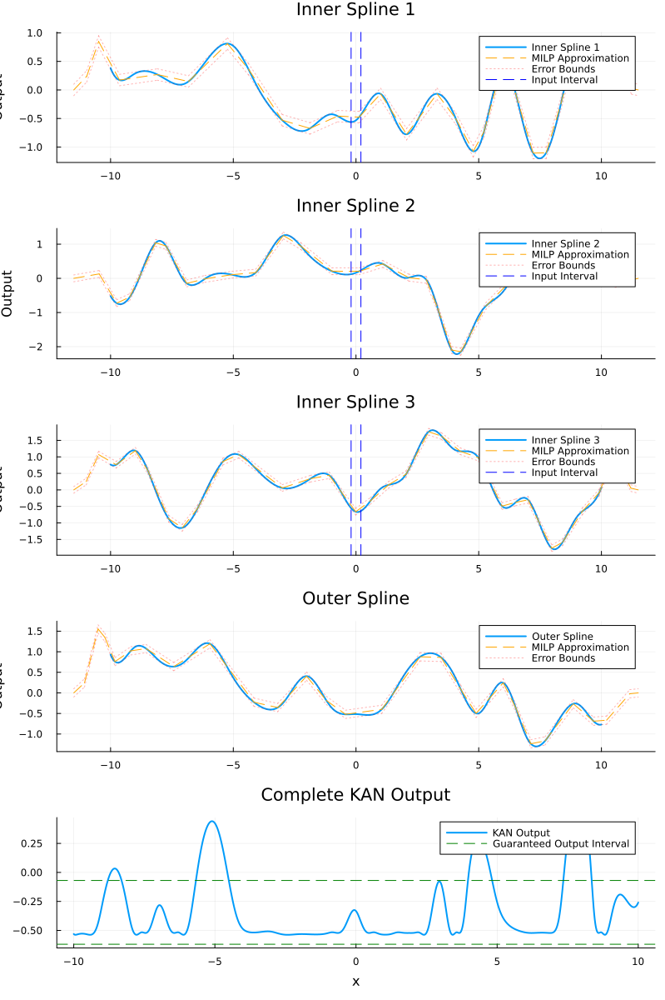

In [9]:
using JuMP
using Gurobi

function kan_interval_analysis_MIP(
    inner_approx::Vector{DynamicSplineApproximation}, 
    outer_approx::DynamicSplineApproximation,
    x_min::Float64, 
    x_max::Float64
)
    model = Model(Gurobi.Optimizer)
    global_x_min = minimum(approx.segments[1][1] for approx in inner_approx)
    global_x_max = maximum(approx.segments[end][2] for approx in inner_approx)
    
    @variable(model, global_x_min <= x <= global_x_max)
    @variable(model, inner_outputs[1:3])
    @variable(model, final_y)
    @constraint(model, x_min <= x)
    @constraint(model, x <= x_max)

    # Handle inner splines
    inner_indicators = Vector{Vector{VariableRef}}(undef, length(inner_approx))
    for (i, approx) in enumerate(inner_approx)
        n_segments = length(approx.segments)
        inner_indicators[i] = @variable(model, [1:n_segments], Bin, base_name="segment_indicator_inner_$i")
        # One segment must be active at a time
        @constraint(model, sum(inner_indicators[i]) == 1)
        for (j, (start_x, end_x, slope, intercept)) in enumerate(approx.segments)
            # Conditional constraints for x and inner_outputs
            indicator = inner_indicators[i][j]
            @constraint(model, indicator => {x >= start_x})
            @constraint(model, indicator => {x <= end_x})
            y_approx = slope * x + intercept
            @constraint(model, indicator => {inner_outputs[i] <= y_approx + approx.max_error})
            @constraint(model, indicator => {inner_outputs[i] >= y_approx - approx.max_error})
        end
    end

    # Handle outer spline
    inner_sum = sum(inner_outputs)
    outer_min = minimum(segment[1] for segment in outer_approx.segments)
    outer_max = maximum(segment[2] for segment in outer_approx.segments)
    @constraint(model, outer_min <= inner_sum <= outer_max)
    n_outer_segments = length(outer_approx.segments)
    @variable(model, segment_indicator_outer[1:n_outer_segments], Bin)
    # One segment must be active at a time
    @constraint(model, sum(segment_indicator_outer) == 1)
    for (j, (start_x, end_x, slope, intercept)) in enumerate(outer_approx.segments)
        # Conditional constraints for inner_sum and final_y
        indicator = segment_indicator_outer[j]
        @constraint(model, indicator => {inner_sum >= start_x})
        @constraint(model, indicator => {inner_sum <= end_x})
        y_approx = slope * inner_sum + intercept
        @constraint(model, indicator => {final_y <= y_approx + outer_approx.max_error})
        @constraint(model, indicator => {final_y >= y_approx - outer_approx.max_error})
    end

    @objective(model, Min, final_y)
    optimize!(model)
    min_output = value(final_y)
    @objective(model, Max, final_y)
    optimize!(model)
    max_output = value(final_y)
    
    return (min_output, max_output)
end


function plot_kan_interval_analysis_MIP(kan::KAN, inner_approx::Vector{DynamicSplineApproximation}, outer_approx::DynamicSplineApproximation, x_min::Float64, x_max::Float64, x_sample::AbstractVector{Float64})
    p = plot(layout=(5,1), size=(800,1200), legend=:topright)
    for (i, (spline, approx)) in enumerate(zip(kan.inner_splines, inner_approx))
        spline_vals = [eval_spline(spline, x) for x in x_sample]
        plot!(p[i], x_sample, spline_vals, label="Inner Spline $i", linewidth=2)
        for (j, (start_x, end_x, slope, intercept)) in enumerate(approx.segments)
            x_segment = range(start_x, end_x, length=50)
            y_segment = [slope * x + intercept for x in x_segment]
            plot!(p[i], x_segment, y_segment,
                linestyle=:dash,
                label=(j==1 ? "MILP Approximation" : false),
                color=:orange)
            plot!(p[i], x_segment, y_segment .+ approx.max_error,
                linestyle=:dot,
                color=:red,
                alpha=0.3,
                label=(j==1 ? "Error Bounds" : false))
            plot!(p[i], x_segment, y_segment .- approx.max_error,
                linestyle=:dot,
                color=:red,
                alpha=0.3,
                label=false)
        end
        vline!(p[i], [x_min, x_max],
            color=:blue,
            linestyle=:dash,
            label="Input Interval")
            
        title!(p[i], "Inner Spline $i")
        ylabel!(p[i], "Output")
    end
    
    outer_vals = [eval_spline(kan.outer_spline, x) for x in x_sample]
    plot!(p[4], x_sample, outer_vals, label="Outer Spline", linewidth=2)
    for (j, (start_x, end_x, slope, intercept)) in enumerate(outer_approx.segments)
        x_segment = range(start_x, end_x, length=50)
        y_segment = [slope * x + intercept for x in x_segment]
        plot!(p[4], x_segment, y_segment,
            linestyle=:dash,
            label=(j==1 ? "MILP Approximation" : false),
            color=:orange)
        plot!(p[4], x_segment, y_segment .+ outer_approx.max_error,
            linestyle=:dot,
            color=:red,
            alpha=0.3,
            label=(j==1 ? "Error Bounds" : false))
        plot!(p[4], x_segment, y_segment .- outer_approx.max_error,
            linestyle=:dot,
            color=:red,
            alpha=0.3,
            label=false)
    end

    title!(p[4], "Outer Spline")
    ylabel!(p[4], "Output")
    kan_vals = [kan(x) for x in x_sample]
    plot!(p[5], x_sample, kan_vals,
        label="KAN Output",
        linewidth=2)
    output_interval = kan_interval_analysis_MIP(inner_approx, outer_approx, x_min, x_max)
    hline!(p[5], [output_interval[1], output_interval[2]],
        color=:green,
        linestyle=:dash,
        label="Guaranteed Output Interval")
    title!(p[5], "Complete KAN Output")
    xlabel!(p[5], "x")
    ylabel!(p[5], "Output")
    
    return p, output_interval
end

function analyze_kan_interval(kan::KAN, x_min::Float64, x_max::Float64, max_error::Float64=0.1)
    inner_approx, outer_approx = fit_bspline_segments_given_max_error(kan, max_error)
    println("Segment analysis:")
    for (i, approx) in enumerate(inner_approx)
        println("Inner spline $i: $(length(approx.segments)) segments")
    end
    println("Outer spline: $(length(outer_approx.segments)) segments")
    x_sample = LinRange(-10, 10, 1000)
    p, output_interval = plot_kan_interval_analysis_MIP(kan, inner_approx, outer_approx, x_min, x_max, x_sample)
    println("\nFor input interval [$(x_min), $(x_max)]")
    println("Output is guaranteed to be in [$(output_interval[1]), $(output_interval[2])]")
    return p, output_interval, (inner_approx, outer_approx)
end

kan = KAN(3)
x_min, x_max = -0.2, 0.2
max_error = 0.1
p, output_interval, approximations = analyze_kan_interval(kan, x_min, x_max, max_error)
display(p)

![image.png](bspline2.png)

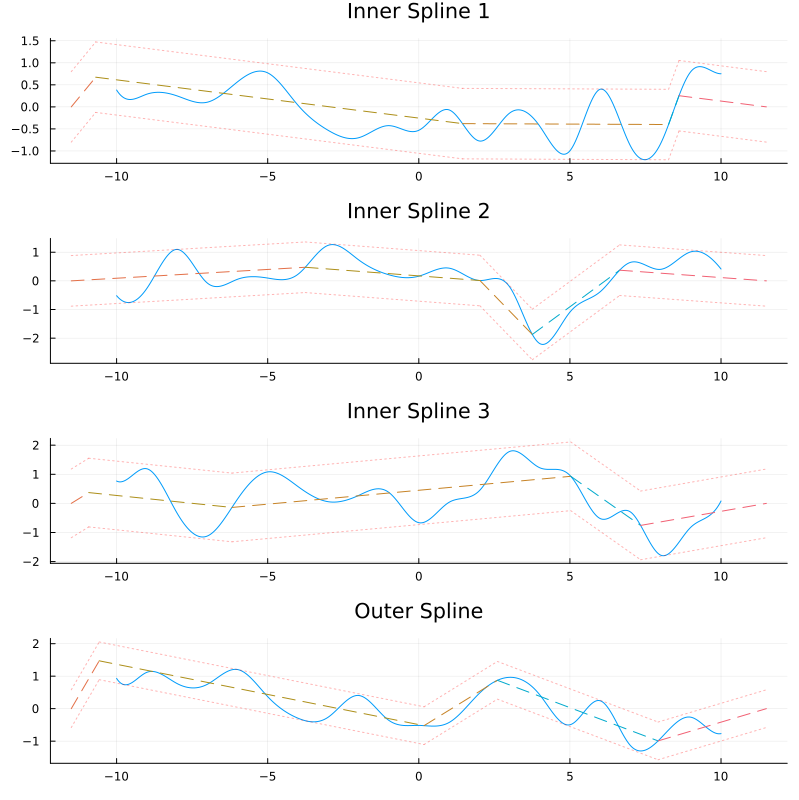

In [10]:
function fit_line_through_points(x1::Float64, y1::Float64, x2::Float64, y2::Float64)
    slope = (y2 - y1) / (x2 - x1)
    intercept = y1 - slope * x1
    return slope, intercept
end

function compute_max_error(x_points::Vector{Float64}, y_points::Vector{Float64}, slope::Float64, intercept::Float64)
    y_predicted = slope .* x_points .+ intercept
    return maximum(abs.(y_predicted - y_points))
end

struct DynamicSplineApproximation
    segments::Vector{Tuple{Float64, Float64, Float64, Float64}}  # (start_x, end_x, slope, intercept)
    max_error::Float64
end

function compute_segment_error(x_points::Vector{Float64}, y_points::Vector{Float64}, start_idx::Int, end_idx::Int)
    if end_idx <= start_idx
        return Inf
    end
    slope, intercept = fit_line_through_points(x_points[start_idx], y_points[start_idx], x_points[end_idx], y_points[end_idx])
    return compute_max_error(x_points[start_idx:end_idx], y_points[start_idx:end_idx], slope, intercept)
end

function find_bspline_segments_given_max_segments(bs::BSpline, max_segments::Int, min_x::Float64, max_x::Float64)
    n_samples = 200
    x_points = collect(LinRange(min_x, max_x, n_samples))
    y_points = [eval_spline(bs, x) for x in x_points]
    
    # Initialize dynamic programming tables
    # dp[i,j] = min error using i segments up to point j
    dp = fill(Inf, (max_segments, n_samples))
    # back[i,j] = endpoint of previous segment in the optimal solution
    back = zeros(Int, (max_segments, n_samples))
    # Base case: first segment
    for j in 2:n_samples
        error = compute_segment_error(x_points, y_points, 1, j)
        dp[1,j] = error
    end
    # Other Segments
    for i in 2:max_segments
        for j in i:n_samples
            # Try all possible previous segment endpoints and write the maximum to the slot
            for k in (i-1):(j-1)
                prev_error = dp[i-1,k]
                curr_error = compute_segment_error(x_points, y_points, k, j)
                total_error = max(prev_error, curr_error)
                if total_error < dp[i,j]
                    dp[i,j] = total_error
                    back[i,j] = k
                end
            end
        end
    end
    
    # Backtrack through the segments
    segments = Tuple{Float64, Float64, Float64, Float64}[]
    curr_seg = n_samples
    for i in max_segments:-1:1
        prev_seg = i > 1 ? back[i,curr_seg] : 1
        # Get segment endpoints
        x1, y1 = x_points[prev_seg], y_points[prev_seg]
        x2, y2 = x_points[curr_seg], y_points[curr_seg]
        slope, intercept = fit_line_through_points(x1, y1, x2, y2)
        pushfirst!(segments, (x1, x2, slope, intercept))
        curr_seg = prev_seg
    end

    return segments, dp[max_segments,n_samples]
end

function fit_bspline_segments_given_max_segments(kan::KAN, max_segments::Int)
    min_x = minimum(kan.inner_splines[1].grid_knots)
    max_x = maximum(kan.inner_splines[1].grid_knots)
    inner_approximations = DynamicSplineApproximation[]
    max_achieved_error = 0.0
    for spline in kan.inner_splines
        segments, error = find_bspline_segments_given_max_segments(spline, max_segments, min_x, max_x)
        max_achieved_error = max(max_achieved_error, error)
        push!(inner_approximations, DynamicSplineApproximation(segments, error))
    end

    min_x = minimum(kan.outer_spline.grid_knots)
    max_x = maximum(kan.outer_spline.grid_knots)
    outer_segments, outer_error = find_bspline_segments_given_max_segments(kan.outer_spline, max_segments, min_x, max_x)
    max_achieved_error = max(max_achieved_error, outer_error)
    outer_approx = DynamicSplineApproximation(outer_segments, outer_error)
    
    return inner_approximations, outer_approx, max_achieved_error
end

kan = KAN(3)
max_segments = 5
inner_approx, outer_approx, max_error = fit_bspline_segments_given_max_segments(kan, max_segments)
x_sample = LinRange(-10, 10, 1000)
p = plot_fitted_segments(kan, inner_approx, outer_approx, x_sample)
display(p)

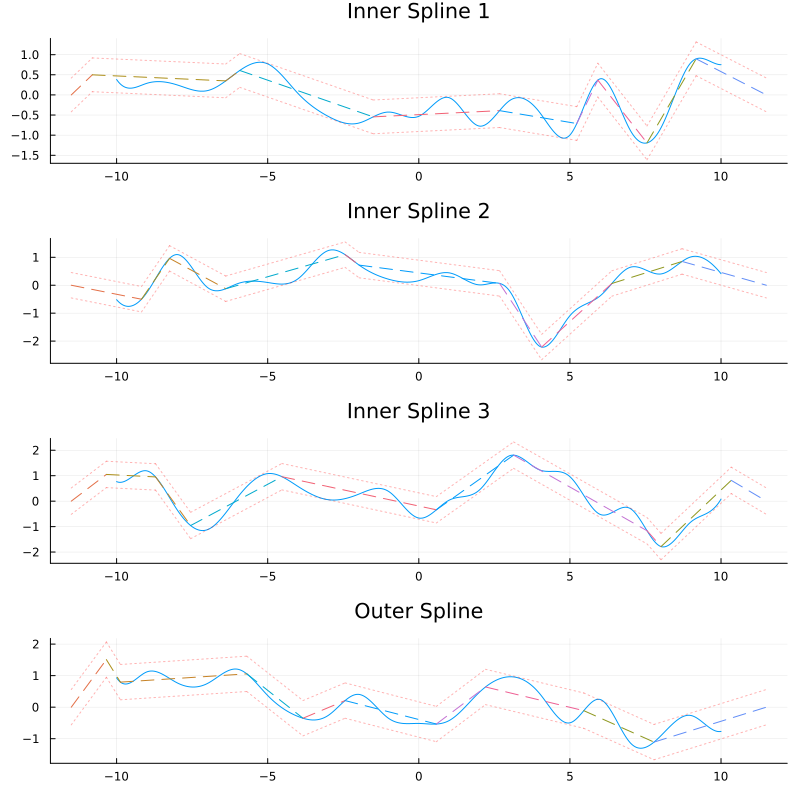

In [11]:
function find_bspline_segments_given_max_segments(bs::BSpline, max_segments::Int, min_x::Float64, max_x::Float64)
    n_samples = min(max_segments * 10, 500)
    x_points = collect(LinRange(min_x, max_x, n_samples))
    y_points = [eval_spline(bs, x) for x in x_points]

    # Precompute Errors
    n = length(x_points)
    errors = fill(Inf, (n, n))
    for start_idx in 1:n-1
        # Only compute for segments up to a reasonable length
        max_len = min(n-start_idx+1, round(Int, max_x - min_x))
        end_idx = min(start_idx + max_len-1, n)
        # Get all possible ends for this start point
        end_indices = collect(start_idx:end_idx)
        x_start = x_points[start_idx]
        y_start = y_points[start_idx]
        x_ends = x_points[end_indices]
        y_ends = y_points[end_indices]
        # Get all possible slopes and intercepts
        valid_segments = abs.(x_ends .- x_start) .> 1e-10
        slopes = zeros(length(end_indices))
        intercepts = zeros(length(end_indices))
        slopes[valid_segments] = (y_ends[valid_segments] .- y_start) ./ (x_ends[valid_segments] .- x_start)
        intercepts[valid_segments] = y_start .- slopes[valid_segments] .* x_start
        # For each end point, compute error
        for (end_idx_position, end_idx) in enumerate(end_indices)
            if valid_segments[end_idx_position]
                segment_x = x_points[start_idx:end_idx]
                segment_y = y_points[start_idx:end_idx]
                predicted_y = slopes[end_idx_position] .* segment_x .+ intercepts[end_idx_position]
                errors[start_idx,end_idx] = maximum(abs.(predicted_y .- segment_y))
            end
        end
    end

    # Dynamic Programming Table: dp[i,j] = min error using i segments up to point j
    dp = fill(Inf, (max_segments, n_samples))
    # back[i,j] = endpoint of previous segment in the optimal solution
    back = zeros(Int, (max_segments, n_samples))
    # Base case: first segment
    for j in 1:n_samples
        dp[1,j] = errors[1,j]
    end
    # Other Segments
    for i in 2:max_segments
        for j in i:n_samples
                prev_errors = dp[i-1,1:j-1]
                curr_errors = [errors[k,j] for k in 1:j-1]
                total_errors = max.(prev_errors, curr_errors)
                min_error, min_idx = findmin(total_errors)
                dp[i,j] = min_error
                back[i,j] = min_idx
        end
    end
    
    # Backtrack through segments
    segments = Tuple{Float64, Float64, Float64, Float64}[]
    curr_seg = n_samples
    for i in max_segments:-1:1
        prev_seg = i > 1 ? back[i,curr_seg] : 1
        # Get segment endpoints
        x1, y1 = x_points[prev_seg], y_points[prev_seg]
        x2, y2 = x_points[curr_seg], y_points[curr_seg]
        slope, intercept = fit_line_through_points(x1, y1, x2, y2)
        pushfirst!(segments, (x1, x2, slope, intercept))
        curr_seg = prev_seg
    end
    return segments, dp[max_segments,n_samples]
end

kan = KAN(3)
max_segments = 10
inner_approx, outer_approx, max_error = fit_bspline_segments_given_max_segments(kan, max_segments)
x_sample = LinRange(-10, 10, 1000)
p = plot_fitted_segments(kan, inner_approx, outer_approx, x_sample)
display(p)

![image.png](segment_allocator.png)

Optimal segment allocation: [9, 9, 11, 11]
Maximum error achieved: 0.4843259511754546


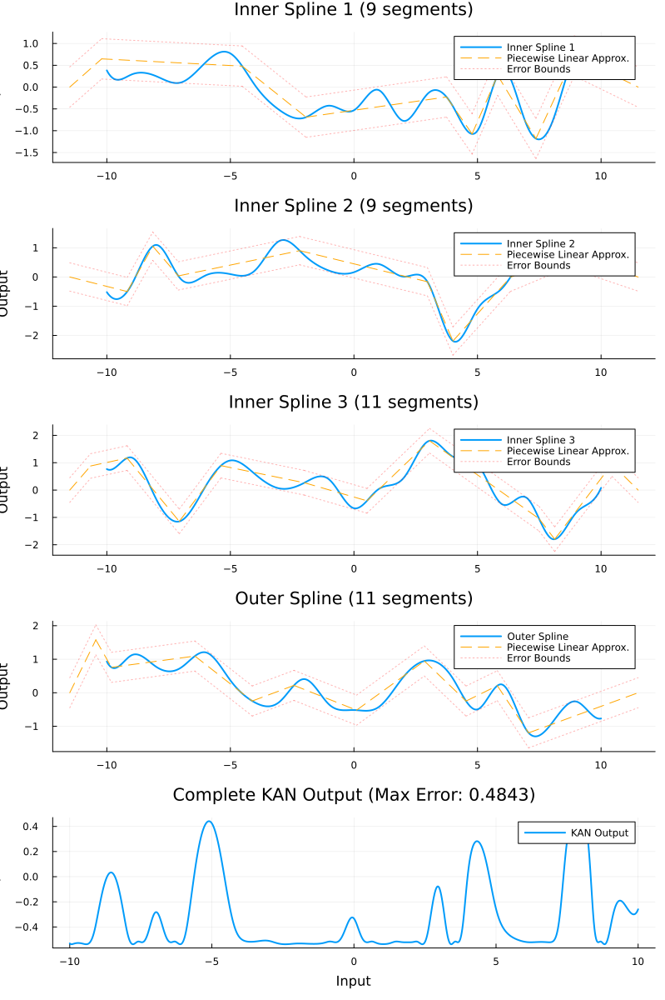

In [12]:
function precompute_spline_errors(spline::BSpline, max_segments::Int, min_x::Float64, max_x::Float64)
    errors = Vector{Float64}(undef, max_segments)
    segments_list = Vector{Vector{Tuple{Float64, Float64, Float64, Float64}}}(undef, max_segments)
    # Compute error for each possible number of segments
    for n_segments in 2:max_segments
        segments, error = find_bspline_segments_given_max_segments(spline, n_segments, min_x, max_x)
        errors[n_segments] = error
        segments_list[n_segments] = segments
    end
    errors[1] = Inf # Fill in 1-segment case with infinity to ensure it's never chosen
    segments_list[1] = []
    return errors, segments_list
end

function fit_kan_given_total_segments(kan::KAN, total_segments::Int)
    min_x_inner = minimum(kan.inner_splines[1].grid_knots)
    max_x_inner = maximum(kan.inner_splines[1].grid_knots)
    min_x_outer = minimum(kan.outer_spline.grid_knots)
    max_x_outer = maximum(kan.outer_spline.grid_knots)
    max_per_spline = total_segments - 2 * (length(kan.inner_splines) + 1)  # Reserve 2 segments for each other spline
    
    # Precompute errors for all splines
    errors_list = Vector{Vector{Float64}}(undef, 4)
    segments_list = Vector{Vector{Vector{Tuple{Float64, Float64, Float64, Float64}}}}(undef, 4)
    for i in 1:3
        errors, segments = precompute_spline_errors(
            kan.inner_splines[i],
            max_per_spline,
            min_x_inner,
            max_x_inner
        )
        errors_list[i] = errors
        segments_list[i] = segments
    end
    errors, segments = precompute_spline_errors(
        kan.outer_spline,
        max_per_spline,
        min_x_outer,
        max_x_outer
    )
    errors_list[4] = errors
    segments_list[4] = segments
    
    # Initialize DP table: [(spline_index, remaining_segments), (min_max_error, allocation)]
    dp = Dict{Tuple{Int, Int}, Tuple{Float64, Vector{Int}}}()
    function solve_dp(spline_idx::Int, remaining_segs::Int)
        # Base cases
        key = (spline_idx, remaining_segs) 
        if haskey(dp, key) # If we've solved the state just return
            return dp[key]
        end
        if spline_idx > 4
            if remaining_segs == 0
                return (0.0, Int[1,1,1,1])
            else
                return (Inf, Int[1,1,1,1])
            end
        end
        if remaining_segs < 2 * (5 - spline_idx)  # Not enough segments left for minimum allocation
            return (Inf, Int[1,1,1,1])
        end
        # Try different segment allocations for current spline
        min_error = Inf
        best_allocation = Int[1,1,1,1]  # default minimum values
        max_segs = min(max_per_spline, remaining_segs - 2 * (4 - spline_idx))
        for n_segments in 2:max_segs
            current_error = errors_list[spline_idx][n_segments]
            future_error, future_allocation = solve_dp(spline_idx + 1, remaining_segs - n_segments)
            max_error = max(current_error, future_error)
            if max_error < min_error
                min_error = max_error
                best_allocation = copy(future_allocation) 
                best_allocation[spline_idx] = n_segments 
            end
        end
        dp[key] = (min_error, best_allocation)
        return dp[key]
    end
    
    #  Create approximations using optimal allocation
    final_error, allocation = solve_dp(1, total_segments)
    inner_approximations = DynamicSplineApproximation[]
    for i in 1:3
        segments = segments_list[i][allocation[i]]
        push!(inner_approximations, DynamicSplineApproximation(segments, errors_list[i][allocation[i]]))
    end
    outer_segments = segments_list[4][allocation[4]]
    outer_approx = DynamicSplineApproximation(outer_segments, errors_list[4][allocation[4]])
    println("Optimal segment allocation: ", allocation)
    println("Maximum error achieved: ", final_error)
    return kan, inner_approximations, outer_approx, final_error
end

function plot_fitted_kan(kan::KAN, inner_approx::Vector{DynamicSplineApproximation}, 
                          outer_approx::DynamicSplineApproximation, final_error::Float64)
    x_sample = LinRange(-10, 10, 1000)
    p = plot(layout=(5,1), size=(800,1200), legend=:topright)
    for (i, (spline, approx)) in enumerate(zip(kan.inner_splines, inner_approx))
        spline_vals = [eval_spline(spline, x) for x in x_sample]
        plot!(p[i], x_sample, spline_vals, 
              label="Inner Spline $i", 
              linewidth=2,
              title="Inner Spline $i ($(length(approx.segments)) segments)")
        for (j, (start_x, end_x, slope, intercept)) in enumerate(approx.segments)
            x_segment = range(start_x, end_x, length=50)
            y_segment = [slope * x + intercept for x in x_segment]
            plot!(p[i], x_segment, y_segment,
                  linestyle=:dash,
                  label=(j==1 ? "Piecewise Linear Approx." : false),
                  color=:orange)
            plot!(p[i], x_segment, y_segment .+ approx.max_error,
                  linestyle=:dot,
                  color=:red,
                  alpha=0.3,
                  label=(j==1 ? "Error Bounds" : false))
            plot!(p[i], x_segment, y_segment .- approx.max_error,
                  linestyle=:dot,
                  color=:red,
                  alpha=0.3,
                  label=false)
        end
        ylabel!(p[i], "Output")
    end
    outer_vals = [eval_spline(kan.outer_spline, x) for x in x_sample]
    plot!(p[4], x_sample, outer_vals, 
          label="Outer Spline", 
          linewidth=2,
          title="Outer Spline ($(length(outer_approx.segments)) segments)")
    for (j, (start_x, end_x, slope, intercept)) in enumerate(outer_approx.segments)
        x_segment = range(start_x, end_x, length=50)
        y_segment = [slope * x + intercept for x in x_segment]
        plot!(p[4], x_segment, y_segment,
              linestyle=:dash,
              label=(j==1 ? "Piecewise Linear Approx." : false),
              color=:orange)
        plot!(p[4], x_segment, y_segment .+ outer_approx.max_error,
              linestyle=:dot,
              color=:red,
              alpha=0.3,
              label=(j==1 ? "Error Bounds" : false))
        plot!(p[4], x_segment, y_segment .- outer_approx.max_error,
              linestyle=:dot,
              color=:red,
              alpha=0.3,
              label=false)
    end
    ylabel!(p[4], "Output")
    kan_vals = [kan(x) for x in x_sample]
    plot!(p[5], x_sample, kan_vals,
          label="KAN Output",
          linewidth=2,
          title="Complete KAN Output (Max Error: $(round(final_error, digits=4)))")
    
    xlabel!(p[5], "Input")
    ylabel!(p[5], "Output")
    return p
end

kan = KAN(3, seed=42)
total_segments = 40
kan, inner_approx, outer_approx, final_error = fit_kan_given_total_segments(kan, total_segments)
p = plot_fitted_kan(kan, inner_approx, outer_approx, final_error)#plot_fitted_segments(kan, inner_approx, outer_approx, x_sample)#plot_fitted_kan(kan, inner_approx, outer_approx, final_error)
display(p)

![image.png](segment_allocator.png)

Optimized segment allocation to achieve error ≤ 0.4:
  Total segments required: 50
  Achieved maximum error: 0.3935964909235058
  Segment allocation:
    Inner spline 1: 11 segments
    Inner spline 2: 12 segments
    Inner spline 3: 14 segments
    Outer spline: 13 segments


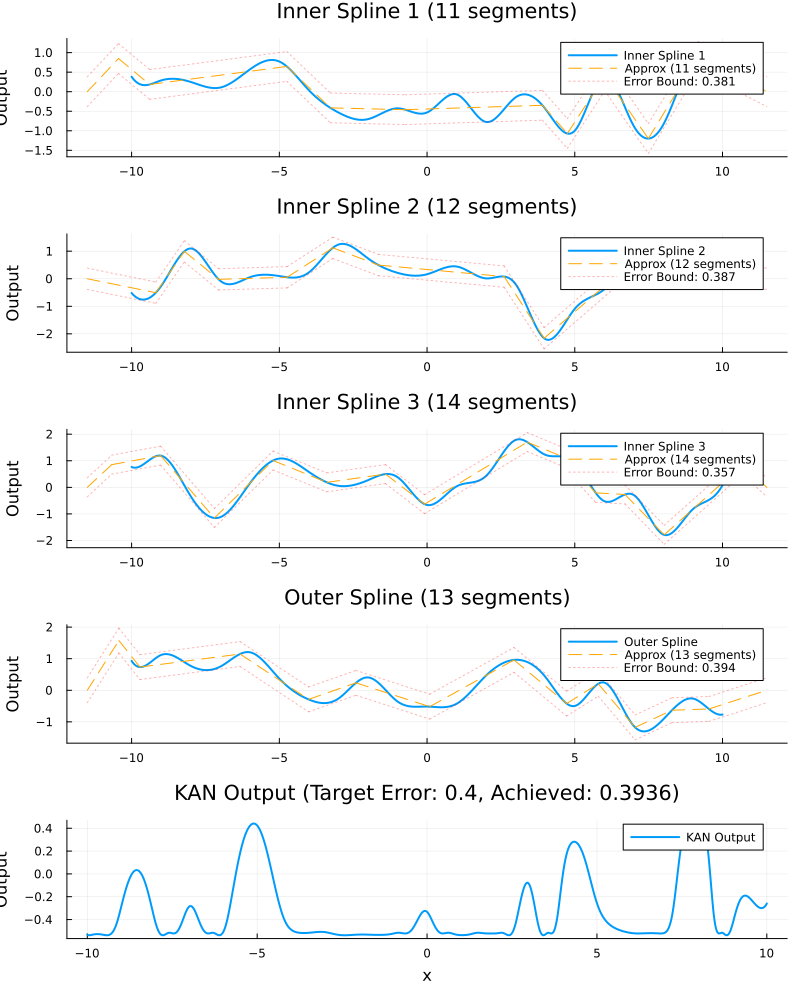

In [13]:
function fit_kan_given_total_error(kan::KAN, target_error::Float64, max_total_segments::Int)
    min_x = minimum(kan.inner_splines[1].grid_knots)
    max_x = maximum(kan.inner_splines[1].grid_knots)
    
    # Precompute errors for each spline with different segment counts
    all_splines = vcat(kan.inner_splines, [kan.outer_spline])
    n_splines = length(all_splines)
    error_tables = Vector{Tuple{Vector{Int}, Vector{Float64}}}(undef, n_splines)
    max_segments_per_spline = max_total_segments
    for (i, spline) in enumerate(all_splines)
        segment_counts = Int[]
        errors = Float64[]
        for seg_count in 1:max_segments_per_spline
            segments, error = find_bspline_segments_given_max_segments(spline, seg_count, min_x, max_x)
            push!(segment_counts, seg_count)
            push!(errors, error)
            # Early stopping if we've reached low enough error
            if error < target_error / 2
                break
            end
        end
        error_tables[i] = (segment_counts, errors)
    end
    
    # Dynamic Programming Table: dp[i,j] = min error using first i-1 splines with j-1 segments allocated
    dp = fill(Inf, (n_splines + 1, max_total_segments + 1))
    # decisions[i,j] = number of segments allocated to the (i-1)th spline in optimal solution for subproblem (i,j)
    decisions = fill(0, (n_splines + 1, max_total_segments + 1))
    # Base case: allocate 0 to all splines (infinite error)
    dp[1, :] .= Inf
    dp[1, 1] = 0.0
    for i in 1:n_splines
        segment_counts, errors = error_tables[i]
        for s in 0:max_total_segments
            dp[i+1, s+1] = Inf  # Default to infinity
            # Try different allocations for current spline
            for (j, seg_count) in enumerate(segment_counts)
                if seg_count <= s
                    prev_error = dp[i, s-seg_count+1]
                    new_max_error = max(prev_error, errors[j])
                    if new_max_error < dp[i+1, s+1]
                        dp[i+1, s+1] = new_max_error
                        decisions[i+1, s+1] = seg_count
                    end
                end
            end
        end
    end
    
    # Find minimum segments required to achieve target error
    min_segments_required = max_total_segments
    for s in 1:max_total_segments
        if dp[n_splines+1, s+1] <= target_error
            min_segments_required = s
            break
        end
    end
    if dp[n_splines+1, min_segments_required+1] > target_error
        @warn "Could not achieve target error of $target_error. Minimum error: $(dp[n_splines+1, min_segments_required+1])"
    end
    
    #  Create approximations using optimal allocation
    allocation = zeros(Int, n_splines)
    remaining_segments = min_segments_required
    for i in n_splines:-1:1
        allocation[i] = decisions[i+1, remaining_segments+1]
        remaining_segments -= allocation[i]
    end
    inner_approximations = DynamicSplineApproximation[]
    for (i, spline) in enumerate(kan.inner_splines)
        segments, error = find_bspline_segments_given_max_segments(spline, allocation[i], min_x, max_x)
        push!(inner_approximations, DynamicSplineApproximation(segments, error))
    end
    outer_segments, outer_error = find_bspline_segments_given_max_segments(
        kan.outer_spline, allocation[end], min_x, max_x)
    outer_approx = DynamicSplineApproximation(outer_segments, outer_error)
    achieved_error = dp[n_splines+1, min_segments_required+1]
    
    println("Optimized segment allocation to achieve error ≤ $target_error:")
    println("  Total segments required: $min_segments_required")
    println("  Achieved maximum error: $achieved_error")
    println("  Segment allocation:")
    for i in 1:length(kan.inner_splines)
        println("    Inner spline $i: $(allocation[i]) segments")
    end
    println("    Outer spline: $(allocation[end]) segments")
    return inner_approximations, outer_approx, achieved_error, allocation
end

function plot_optimized_kan(kan::KAN, inner_approx::Vector{DynamicSplineApproximation}, 
    outer_approx::DynamicSplineApproximation, achieved_error::Float64, allocation::Vector{Int64}, target_error::Float64)
    x_sample = LinRange(-10, 10, 1000)
    p = plot(layout=(5,1), size=(800,1000), legend=:topright)
    for (i, (spline, approx)) in enumerate(zip(kan.inner_splines, inner_approx))
        spline_vals = [eval_spline(spline, x) for x in x_sample]
        plot!(p[i], x_sample, spline_vals, label="Inner Spline $i", linewidth=2)
        for (j, (start_x, end_x, slope, intercept)) in enumerate(approx.segments)
            x_segment = range(start_x, end_x, length=50)
            y_segment = [slope * x + intercept for x in x_segment]
            plot!(p[i], x_segment, y_segment,
                linestyle=:dash,
                label=(j==1 ? "Approx ($(length(approx.segments)) segments)" : false),
                color=:orange)
            plot!(p[i], x_segment, y_segment .+ approx.max_error,
                linestyle=:dot, color=:red, alpha=0.3,
                label=(j==1 ? "Error Bound: $(round(approx.max_error, digits=3))" : false))
            plot!(p[i], x_segment, y_segment .- approx.max_error,
                linestyle=:dot, color=:red, alpha=0.3, label=false)
        end
        title!(p[i], "Inner Spline $i ($(length(approx.segments)) segments)")
        ylabel!(p[i], "Output")
    end
    outer_vals = [eval_spline(kan.outer_spline, x) for x in x_sample]
    plot!(p[4], x_sample, outer_vals, label="Outer Spline", linewidth=2)
    
    for (j, (start_x, end_x, slope, intercept)) in enumerate(outer_approx.segments)
        x_segment = range(start_x, end_x, length=50)
        y_segment = [slope * x + intercept for x in x_segment]
        plot!(p[4], x_segment, y_segment,
            linestyle=:dash,
            label=(j==1 ? "Approx ($(length(outer_approx.segments)) segments)" : false),
            color=:orange)
        plot!(p[4], x_segment, y_segment .+ outer_approx.max_error,
            linestyle=:dot, color=:red, alpha=0.3,
            label=(j==1 ? "Error Bound: $(round(outer_approx.max_error, digits=3))" : false))
        plot!(p[4], x_segment, y_segment .- outer_approx.max_error,
            linestyle=:dot, color=:red, alpha=0.3, label=false)
    end
    title!(p[4], "Outer Spline ($(length(outer_approx.segments)) segments)")
    ylabel!(p[4], "Output")
    kan_vals = [kan(x) for x in x_sample]
    plot!(p[5], x_sample, kan_vals,
        label="KAN Output", linewidth=2)
    title!(p[5], "KAN Output (Target Error: $target_error, Achieved: $(round(achieved_error, digits=4)))")
    xlabel!(p[5], "x")
    ylabel!(p[5], "Output")
    return p
end

kan = KAN(3, seed=42)
target_error = 0.4
inner_approx, outer_approx, achieved_error, allocation = fit_kan_given_total_error(kan, target_error, 200)
p = plot_optimized_kan(kan, inner_approx, outer_approx, achieved_error, allocation, target_error)
display(p)

![image.png](lipschitz.jpg)

Lipschitz constant of outer spline: 2.98163144111796
Inner spline allocations: [37, 34, 41]
Inner spline errors: [0.04693558160853806, 0.051793198652097416, 0.05341412876199565]
Sum of inner errors: 0.1521429090226311
Propagated inner error: 0.4536340810850263
Outer spline allocation: 14
Outer spline error: 0.32679129890333486
Total achieved error: 0.7804253799883611
Total segments used: 126

--- Dynamic Programming Table ---
dp[i,s] = minimum sum of errors for first i inner splines using s segments
i\s |       0 |       1 |       2 |       3 |       4 |       5 |       6 |       7 |       8 |       9 |      10 |      11 |      12 |      13 |      14 |      15 |      16 |      17 |      18 |      19 |      20 |      21 |      22 |      23 |      24 |      25 |      26 |      27 |      28 |      29 |
---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

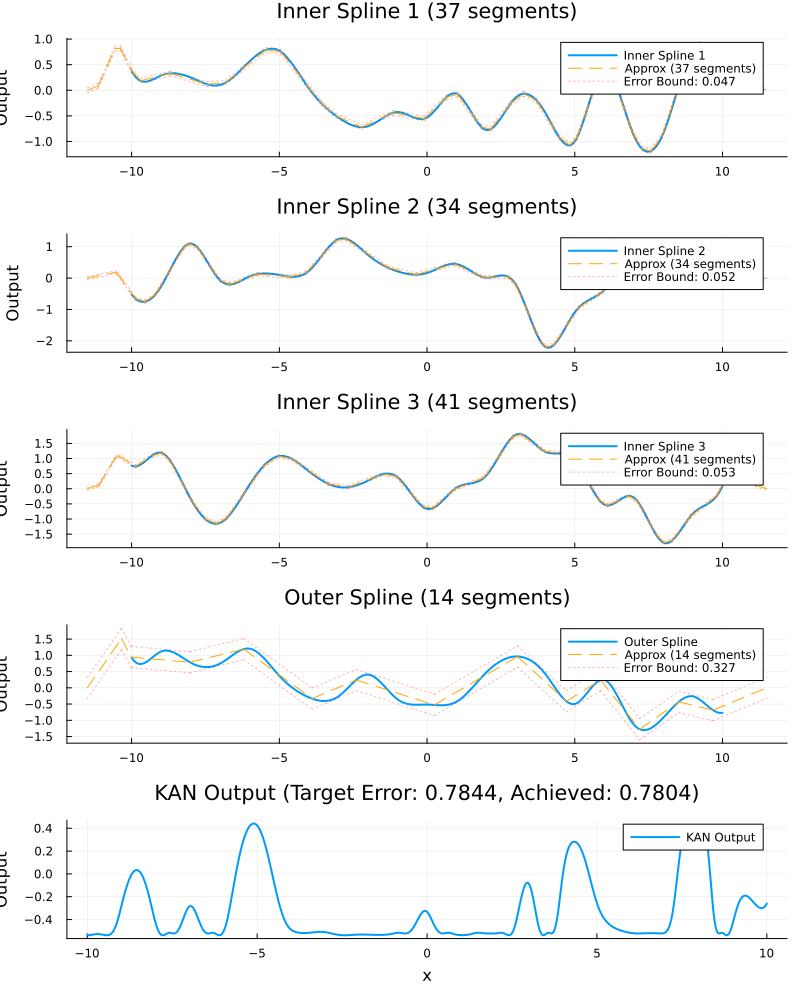

In [14]:
using Printf

function calculate_lipschitz_constant(bs::BSpline, min_x::Float64, max_x::Float64)
    # Sample derivative to get lipschitz constant
    n_samples = 1000
    x_points = collect(LinRange(min_x, max_x, n_samples))
    max_derivative = 0.0
    delta = (max_x - min_x) / (n_samples * 10)
    
    for x in x_points
        y1 = eval_spline(bs, x)
        y2 = eval_spline(bs, x + delta)
        derivative = abs((y2 - y1) / delta)
        max_derivative = max(max_derivative, derivative)
    end
    return max_derivative
end

function fit_kan_given_total_error_lipschitz(kan::KAN, target_error::Float64, max_total_segments::Int)
    min_x = minimum(kan.inner_splines[1].grid_knots)
    max_x = maximum(kan.inner_splines[1].grid_knots)
    
    # Step 1: Calculate Lipschitz constant for the outer spline
    outer_lipschitz = calculate_lipschitz_constant(kan.outer_spline, min_x, max_x)
    
    # Step 2: Separate inner splines and outer spline
    inner_splines = kan.inner_splines
    outer_spline = kan.outer_spline
    n_inner_splines = length(inner_splines)
    
    # Step 3: Compute error tables for all splines
    inner_error_tables = Vector{Tuple{Vector{Int}, Vector{Float64}}}(undef, n_inner_splines)
    for (i, spline) in enumerate(inner_splines)
        segment_counts = Int[]
        errors = Float64[]
        for seg_count in 1:max_total_segments
            segments, error = find_bspline_segments_given_max_segments(spline, seg_count, min_x, max_x)
            push!(segment_counts, seg_count)
            push!(errors, error)
            if error < target_error / (2 * outer_lipschitz * n_inner_splines)
                # We can stop if the error is less than half the target error (after applying Lipschitz constant)
                break
            end
        end
        inner_error_tables[i] = (segment_counts, errors)
    end

    outer_segment_counts = Int[]
    outer_errors = Float64[]
    for seg_count in 1:max_total_segments
        segments, error = find_bspline_segments_given_max_segments(outer_spline, seg_count, min_x, max_x)
        push!(outer_segment_counts, seg_count)
        push!(outer_errors, error)
        if error < target_error / 2
            break
        end
    end
    
    # Dynamic Programming Table: now track the sum of inner spline error and the outer spline error separately
    # dp[i][s] = minimum sum of errors for first i inner splines using s segments
    dp = fill(Inf, (n_inner_splines + 1, max_total_segments + 1))
    decisions = fill(0, (n_inner_splines + 1, max_total_segments + 1))
    
    # Base case: no splines, no error
    dp[1, 1] = 0.0
    # Fill DP table for inner splines only
    for i in 1:n_inner_splines
        segment_counts, errors = inner_error_tables[i]
        for s in 0:max_total_segments
            dp[i+1, s+1] = Inf
            for (j, seg_count) in enumerate(segment_counts)
                if seg_count <= s
                    prev_sum_error = dp[i, s-seg_count+1]
                    new_sum_error = prev_sum_error + errors[j]
                    if new_sum_error < dp[i+1, s+1]
                        dp[i+1, s+1] = new_sum_error
                        decisions[i+1, s+1] = seg_count
                    end
                end
            end
        end
    end
    
    # Step 5: Find optimal allocation considering outer spline and error propagation
    min_segments_required = max_total_segments
    min_total_error = Inf
    best_outer_segments = 1
    
    # Try different allocations for outer spline
    for outer_seg_idx in 1:length(outer_segment_counts)
        outer_seg = outer_segment_counts[outer_seg_idx]
        outer_err = outer_errors[outer_seg_idx]
        
        remaining_for_inner = max_total_segments - outer_seg
        
        if remaining_for_inner >= n_inner_splines  # Need at least one segment per inner spline
            # For each possible inner segment allocation
            for inner_seg in n_inner_splines:remaining_for_inner
                inner_sum_error = dp[n_inner_splines+1, inner_seg+1]
                
                if inner_sum_error < Inf
                    # Calculate total error with propagation
                    propagated_error = outer_lipschitz * inner_sum_error
                    total_error = outer_err + propagated_error
                    
                    # Check if this allocation is better
                    if total_error <= target_error && (inner_seg + outer_seg) < min_segments_required
                        min_segments_required = inner_seg + outer_seg
                        min_total_error = total_error
                        best_outer_segments = outer_seg
                    end
                end
            end
        end
    end
    
    # Step 6: Reconstruct the allocation from DP decisions
    if min_total_error > target_error
        @warn "Could not achieve target error of $target_error. Minimum error: $min_total_error"
    end
    
    inner_allocation = zeros(Int, n_inner_splines)
    remaining_segments = min_segments_required - best_outer_segments
    
    # Backtrack to find inner allocations
    for i in n_inner_splines:-1:1
        inner_allocation[i] = decisions[i+1, remaining_segments+1]
        remaining_segments -= inner_allocation[i]
    end
    
    # Step 7: Build the approximations with the optimal allocation
    inner_approximations = DynamicSplineApproximation[]
    inner_errors = Float64[]
    
    for (i, spline) in enumerate(inner_splines)
        segments, error = find_bspline_segments_given_max_segments(
            spline, inner_allocation[i], min_x, max_x)
        push!(inner_approximations, DynamicSplineApproximation(segments, error))
        push!(inner_errors, error)
    end
    
    outer_segments, outer_error = find_bspline_segments_given_max_segments(
        outer_spline, best_outer_segments, min_x, max_x)
    outer_approx = DynamicSplineApproximation(outer_segments, outer_error)
    
    # Calculate final achieved error with propagation
    propagated_inner_error = outer_lipschitz * sum(inner_errors)
    achieved_error = outer_error + propagated_inner_error
    
    # For debugging and analysis
    println("Lipschitz constant of outer spline: ", outer_lipschitz)
    println("Inner spline allocations: ", inner_allocation)
    println("Inner spline errors: ", inner_errors)
    println("Sum of inner errors: ", sum(inner_errors))
    println("Propagated inner error: ", propagated_inner_error)
    println("Outer spline allocation: ", best_outer_segments)
    println("Outer spline error: ", outer_error)
    println("Total achieved error: ", achieved_error)
    println("Total segments used: ", sum(inner_allocation) + best_outer_segments)
    
    # Output the dynamic programming table
    println("\n--- Dynamic Programming Table ---")
    println("dp[i,s] = minimum sum of errors for first i inner splines using s segments")
    
    # Determine a reasonable limit for display to avoid overwhelming output
    max_rows_to_show = min(n_inner_splines + 1, 10)
    max_cols_to_show = min(min_segments_required + 10, 30)
    
    # Print column headers (segments)
    print("i\\s |")
    for s in 0:max_cols_to_show-1
        @printf("%8d |", s)
    end
    println()
    println("-" ^ (9 * max_cols_to_show + 5))
    
    # Print each row (splines)
    for i in 1:max_rows_to_show
        @printf("%3d |", i-1)
        for s in 0:max_cols_to_show-1
            if dp[i, s+1] == Inf
                print("     Inf |")
            else
                @printf("%8.4f |", dp[i, s+1])
            end
        end
        println()
    end
    
    # Print decisions table if needed
    println("\n--- Decisions Table ---")
    println("decisions[i,s] = number of segments allocated to spline i when using s total segments")
    
    # Print column headers (segments)
    print("i\\s |")
    for s in 0:max_cols_to_show-1
        @printf("%8d |", s)
    end
    println()
    println("-" ^ (9 * max_cols_to_show + 5))
    
    # Print each row (splines)
    for i in 1:max_rows_to_show
        @printf("%3d |", i-1)
        for s in 0:max_cols_to_show-1
            @printf("%8d |", decisions[i, s+1])
        end
        println()
    end
    
    return inner_approximations, outer_approx, achieved_error, vcat(inner_allocation, best_outer_segments)
end

function plot_optimized_kan(kan::KAN, inner_approx::Vector{DynamicSplineApproximation}, 
    outer_approx::DynamicSplineApproximation, achieved_error::Float64, allocation::Vector{Int64}, target_error::Float64)
    x_sample = LinRange(-10, 10, 1000)
    p = plot(layout=(5,1), size=(800,1000), legend=:topright)
    for (i, (spline, approx)) in enumerate(zip(kan.inner_splines, inner_approx))
        spline_vals = [eval_spline(spline, x) for x in x_sample]
        plot!(p[i], x_sample, spline_vals, label="Inner Spline $i", linewidth=2)
        for (j, (start_x, end_x, slope, intercept)) in enumerate(approx.segments)
            x_segment = range(start_x, end_x, length=50)
            y_segment = [slope * x + intercept for x in x_segment]
            plot!(p[i], x_segment, y_segment,
                linestyle=:dash,
                label=(j==1 ? "Approx ($(length(approx.segments)) segments)" : false),
                color=:orange)
            plot!(p[i], x_segment, y_segment .+ approx.max_error,
                linestyle=:dot, color=:red, alpha=0.3,
                label=(j==1 ? "Error Bound: $(round(approx.max_error, digits=3))" : false))
            plot!(p[i], x_segment, y_segment .- approx.max_error,
                linestyle=:dot, color=:red, alpha=0.3, label=false)
        end
        title!(p[i], "Inner Spline $i ($(length(approx.segments)) segments)")
        ylabel!(p[i], "Output")
    end
    outer_vals = [eval_spline(kan.outer_spline, x) for x in x_sample]
    plot!(p[4], x_sample, outer_vals, label="Outer Spline", linewidth=2)
    
    for (j, (start_x, end_x, slope, intercept)) in enumerate(outer_approx.segments)
        x_segment = range(start_x, end_x, length=50)
        y_segment = [slope * x + intercept for x in x_segment]
        plot!(p[4], x_segment, y_segment,
            linestyle=:dash,
            label=(j==1 ? "Approx ($(length(outer_approx.segments)) segments)" : false),
            color=:orange)
        plot!(p[4], x_segment, y_segment .+ outer_approx.max_error,
            linestyle=:dot, color=:red, alpha=0.3,
            label=(j==1 ? "Error Bound: $(round(outer_approx.max_error, digits=3))" : false))
        plot!(p[4], x_segment, y_segment .- outer_approx.max_error,
            linestyle=:dot, color=:red, alpha=0.3, label=false)
    end
    title!(p[4], "Outer Spline ($(length(outer_approx.segments)) segments)")
    ylabel!(p[4], "Output")
    kan_vals = [kan(x) for x in x_sample]
    plot!(p[5], x_sample, kan_vals,
        label="KAN Output", linewidth=2)
    title!(p[5], "KAN Output (Target Error: $target_error, Achieved: $(round(achieved_error, digits=4)))")
    xlabel!(p[5], "x")
    ylabel!(p[5], "Output")
    return p
end

kan = KAN(3, seed=42)
target_error = 0.7844
inner_approx, outer_approx, achieved_error, allocation = fit_kan_given_total_error_lipschitz(kan, target_error, 300)
p = plot_optimized_kan(kan, inner_approx, outer_approx, achieved_error, allocation, target_error)
display(p)

Segments: 4, Error: 13.300300348395734
Segments: 11, Error: 9.309779380606534
Segments: 18, Error: 6.8457365406030695
Segments: 25, Error: 5.5075150318058625
Segments: 32, Error: 4.711019371169005
Segments: 39, Error: 3.723202440331714
Segments: 46, Error: 3.1807432886167186
Segments: 53, Error: 2.6170678820683237
Segments: 60, Error: 2.116238682767941


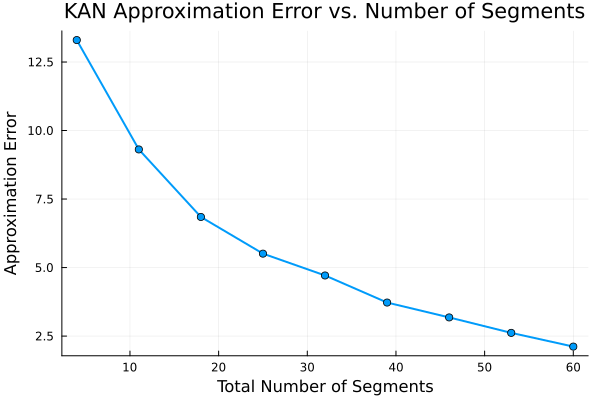

In [15]:
function fit_kan_given_total_segments_lipschitz(kan::KAN, total_segments::Int)
    min_x = minimum(kan.inner_splines[1].grid_knots)
    max_x = maximum(kan.inner_splines[1].grid_knots)
    
    # Calculate Lipschitz constant for the outer spline
    outer_lipschitz = calculate_lipschitz_constant(kan.outer_spline, min_x, max_x)
    
    inner_splines = kan.inner_splines
    outer_spline = kan.outer_spline
    n_inner_splines = length(inner_splines)
    
    # Need at least one segment per spline
    if total_segments < n_inner_splines + 1
        return Inf, zeros(Int, n_inner_splines + 1)
    end
    
    # Calculate error tables for all splines
    inner_error_tables = Vector{Vector{Tuple{Int, Float64}}}(undef, n_inner_splines)
    
    for (i, spline) in enumerate(inner_splines)
        error_table = Tuple{Int, Float64}[]
        for seg_count in 1:total_segments-n_inner_splines
            segments, error = find_bspline_segments_given_max_segments(spline, seg_count, min_x, max_x)
            push!(error_table, (seg_count, error))
        end
        inner_error_tables[i] = error_table
    end
    
    # Calculate error table for outer spline
    outer_error_table = Tuple{Int, Float64}[]
    for seg_count in 1:total_segments-n_inner_splines
        segments, error = find_bspline_segments_given_max_segments(outer_spline, seg_count, min_x, max_x)
        push!(outer_error_table, (seg_count, error))
    end
    
    # Dynamic programming approach to find minimum error allocation
    # State: dp[i][s] = minimum sum of errors for first i inner splines using s segments
    dp = fill(Inf, (n_inner_splines + 1, total_segments + 1))
    decisions = fill(0, (n_inner_splines + 1, total_segments + 1))
    
    # Base case: 0 error if 0 splines and 0 segments
    dp[1, 1] = 0.0
    
    # Fill DP table for inner splines
    for i in 1:n_inner_splines
        for s in 1:total_segments
            dp[i+1, s+1] = Inf
            for (seg_count, error) in inner_error_tables[i]
                if seg_count <= s
                    prev_sum_error = dp[i, s-seg_count+1]
                    
                    if prev_sum_error < Inf
                        new_sum_error = prev_sum_error + error
                        
                        if new_sum_error < dp[i+1, s+1]
                            dp[i+1, s+1] = new_sum_error
                            decisions[i+1, s+1] = seg_count
                        end
                    end
                end
            end
        end
    end
    
    # Find best allocation for outer spline
    min_error = Inf
    best_allocation = zeros(Int, n_inner_splines + 1)
    
    # Consider different allocations of the remaining segments to the outer spline
    for inner_segments in n_inner_splines:total_segments-1
        inner_sum_error = dp[n_inner_splines+1, inner_segments+1]
        
        if inner_sum_error < Inf
            outer_segments = total_segments - inner_segments
            
            if outer_segments > 0 && outer_segments <= length(outer_error_table)
                _, outer_error = outer_error_table[outer_segments]
                
                # Calculate total error with propagation
                propagated_error = outer_lipschitz * inner_sum_error
                total_error = outer_error + propagated_error
                
                if total_error < min_error
                    min_error = total_error
                    
                    # Reconstruct allocation for inner splines
                    remaining = inner_segments
                    for i in n_inner_splines:-1:1
                        best_allocation[i] = decisions[i+1, remaining+1]
                        remaining -= best_allocation[i]
                    end
                    
                    # Set allocation for outer spline
                    best_allocation[n_inner_splines+1] = outer_segments
                end
            end
        end
    end
    
    return min_error, best_allocation
end

function compute_kan_tradeoff_curve(kan::KAN, max_segments::Int)
    segment_points = Int[]
    error_points = Float64[]
    allocations = Vector{Vector{Int}}()
    
    n_inner_splines = length(kan.inner_splines)
    min_segments = n_inner_splines + 1  # Need at least one segment per spline
    
    for total_segments in min_segments:7:max_segments
        error, allocation = fit_kan_given_total_segments_lipschitz(kan, total_segments)
        push!(segment_points, total_segments)
        push!(error_points, error)
        push!(allocations, allocation)
        println("Segments: $total_segments, Error: $error")
    end
    
    return segment_points, error_points, allocations
end

function plot_kan_tradeoff_curve(segment_points::Vector{Int}, error_points::Vector{Float64})
    p = plot(segment_points, error_points, 
             xlabel="Total Number of Segments", 
             ylabel="Approximation Error",
             title="KAN Approximation Error vs. Number of Segments",
             marker=:circle,
             legend=false,
             linewidth=2)
    return p
end

kan = KAN(3, seed=42)
segments, errors, allocations = compute_kan_tradeoff_curve(kan, 60)
p_tradeoff = plot_kan_tradeoff_curve(segments, errors)
display(p_tradeoff)

Outer spline Lipschitz constant: 2.98163144111796
Set parameter Username
Set parameter LicenseID to value 2620375
Academic license - for non-commercial use only - expires 2026-02-10
Gurobi Optimizer version 12.0.0 build v12.0.0rc1 (mac64[arm] - Darwin 24.3.0 24D70)

CPU model: Apple M2 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 6 rows, 546 columns and 1638 nonzeros
Model fingerprint: 0x1c5da494
Variable types: 0 continuous, 546 integer (546 binary)
Coefficient statistics:
  Matrix range     [1e-02, 2e+02]
  Objective range  [1e+00, 2e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-01, 2e+02]
Found heuristic solution: objective 187.0000000
Presolve removed 0 rows and 104 columns
Presolve time: 0.01s
Presolved: 6 rows, 442 columns, 1320 nonzeros
Variable types: 0 continuous, 442 integer (442 binary)

Root relaxation: objective 1.127637e+02, 23 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current

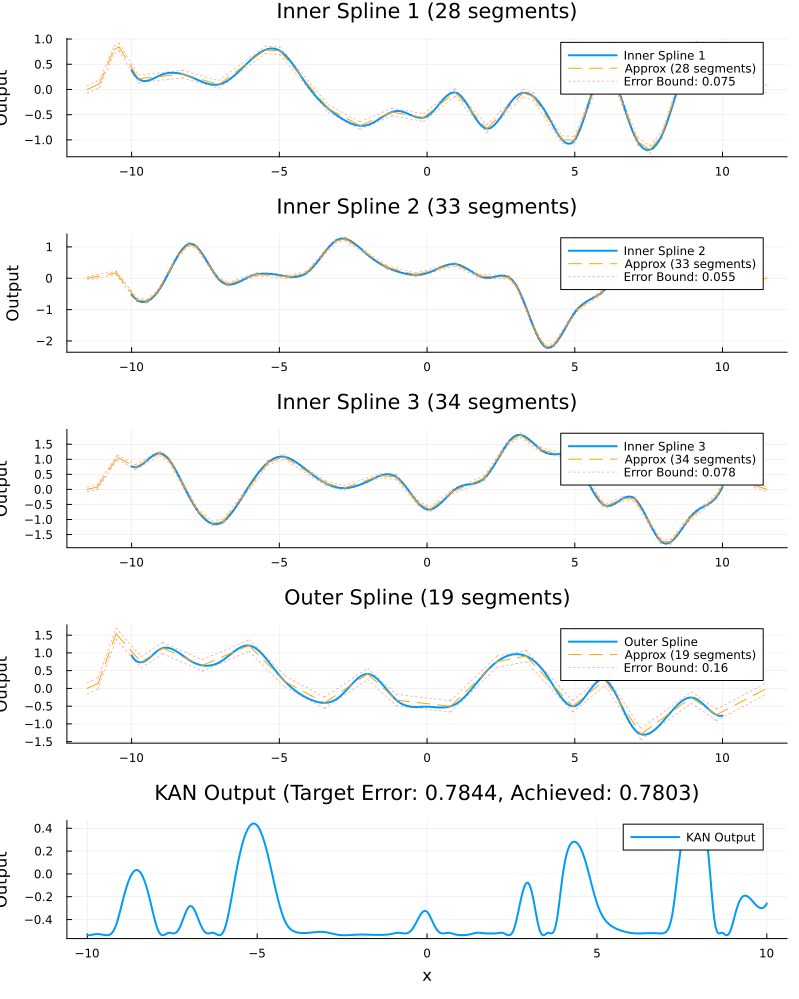

In [16]:
function fit_kan_given_total_error_lipschitz_gurobi(kan::KAN, target_error::Float64, max_total_segments::Int)
    min_x = minimum(kan.inner_splines[1].grid_knots)
    max_x = maximum(kan.inner_splines[1].grid_knots)
    
    # Calculate Lipschitz constant of the outer spline
    outer_lipschitz = calculate_lipschitz_constant(kan.outer_spline, min_x, max_x)
    println("Outer spline Lipschitz constant: ", outer_lipschitz)
    
    # Calculate target error budget for inner splines (accounting for outer spline contribution)
    # We'll allocate half the error budget to inner splines and half to the outer spline
    inner_target_error = target_error / 2
    outer_target_error = target_error / 2
    
    n_inner_splines = length(kan.inner_splines)
    
    # Pre-compute segment options and errors for all splines
    inner_options = Vector{Vector{Tuple{Int, Float64}}}(undef, n_inner_splines)
    
    # For each inner spline, compute approximation options
    for (i, spline) in enumerate(kan.inner_splines)
        options = Tuple{Int, Float64}[]
        for seg_count in 1:max_total_segments
            segments, error = find_bspline_segments_given_max_segments(spline, seg_count, min_x, max_x)
            # Store the raw error (we'll scale by Lipschitz during optimization)
            push!(options, (seg_count, error))
            # Early stopping if this spline can be approximated very accurately
            if error < inner_target_error / (n_inner_splines * outer_lipschitz * 10)
                break
            end
        end
        inner_options[i] = options
    end
    
    # Compute outer spline approximation options
    outer_options = Tuple{Int, Float64}[]
    for seg_count in 1:max_total_segments
        segments, error = find_bspline_segments_given_max_segments(kan.outer_spline, seg_count, min_x, max_x)
        push!(outer_options, (seg_count, error))
        if error < outer_target_error / 10
            break
        end
    end
    
    # Set up JuMP model for segment allocation optimization
    model = Model(Gurobi.Optimizer)
    
    # Define decision variables: which approximation option to use for each spline
    @variable(model, x[i=1:n_inner_splines, j=1:length(inner_options[i])], Bin)
    @variable(model, y[j=1:length(outer_options)], Bin)
    
    # Constraint: exactly one approximation option per spline
    for i in 1:n_inner_splines
        @constraint(model, sum(x[i, j] for j in 1:length(inner_options[i])) == 1)
    end
    @constraint(model, sum(y[j] for j in 1:length(outer_options)) == 1)
    
    # Total segment usage constraint
    @constraint(model, 
        sum(inner_options[i][j][1] * x[i, j] for i in 1:n_inner_splines, j in 1:length(inner_options[i])) +
        sum(outer_options[j][1] * y[j] for j in 1:length(outer_options)) <= max_total_segments
    )
    
    # Inner spline error calculation (additive, scaled by Lipschitz constant)
    @expression(model, inner_error, 
        sum(inner_options[i][j][2] * x[i, j] for i in 1:n_inner_splines, j in 1:length(inner_options[i])) * outer_lipschitz
    )
    
    # Outer spline error
    @expression(model, outer_error,
        sum(outer_options[j][2] * y[j] for j in 1:length(outer_options))
    )
    
    # Total error constraint
    @constraint(model, inner_error + outer_error <= target_error)
    
    # Objective: minimize total segment usage
    @objective(model, Min, 
        sum(inner_options[i][j][1] * x[i, j] for i in 1:n_inner_splines, j in 1:length(inner_options[i])) +
        sum(outer_options[j][1] * y[j] for j in 1:length(outer_options))
    )
    
    # Solve the model
    optimize!(model)
    
    # Extract solution
    allocation = zeros(Int, n_inner_splines + 1)
    
    achieved_inner_error = 0.0
    for i in 1:n_inner_splines
        for j in 1:length(inner_options[i])
            if value(model[:x][i, j]) > 0.5  # Binary variable is selected
                allocation[i] = inner_options[i][j][1]  # Get segment count
                achieved_inner_error += inner_options[i][j][2]  # Add to error
                break
            end
        end
    end
    
    achieved_outer_error = 0.0
    for j in 1:length(outer_options)
        if value(model[:y][j]) > 0.5  # Binary variable is selected
            allocation[end] = outer_options[j][1]  # Get segment count
            achieved_outer_error = outer_options[j][2]  # Set outer error
            break
        end
    end
    
    # Total error with correct propagation
    total_achieved_error = achieved_inner_error * outer_lipschitz + achieved_outer_error
    
    println("Segment allocation: ", allocation)
    println("Achieved error: ", total_achieved_error)
    
    # Generate approximations using allocated segments
    inner_approximations = DynamicSplineApproximation[]
    for (i, spline) in enumerate(kan.inner_splines)
        segments, error = find_bspline_segments_given_max_segments(spline, allocation[i], min_x, max_x)
        push!(inner_approximations, DynamicSplineApproximation(segments, error))
    end
    
    outer_segments, outer_error = find_bspline_segments_given_max_segments(
        kan.outer_spline, allocation[end], min_x, max_x)
    outer_approx = DynamicSplineApproximation(outer_segments, outer_error)
    
    return inner_approximations, outer_approx, total_achieved_error, allocation
end

function plot_optimized_kan(kan::KAN, inner_approx::Vector{DynamicSplineApproximation}, 
    outer_approx::DynamicSplineApproximation, achieved_error::Float64, allocation::Vector{Int64}, target_error::Float64)
    x_sample = LinRange(-10, 10, 1000)
    p = plot(layout=(5,1), size=(800,1000), legend=:topright)
    for (i, (spline, approx)) in enumerate(zip(kan.inner_splines, inner_approx))
        spline_vals = [eval_spline(spline, x) for x in x_sample]
        plot!(p[i], x_sample, spline_vals, label="Inner Spline $i", linewidth=2)
        for (j, (start_x, end_x, slope, intercept)) in enumerate(approx.segments)
            x_segment = range(start_x, end_x, length=50)
            y_segment = [slope * x + intercept for x in x_segment]
            plot!(p[i], x_segment, y_segment,
                linestyle=:dash,
                label=(j==1 ? "Approx ($(length(approx.segments)) segments)" : false),
                color=:orange)
            plot!(p[i], x_segment, y_segment .+ approx.max_error,
                linestyle=:dot, color=:red, alpha=0.3,
                label=(j==1 ? "Error Bound: $(round(approx.max_error, digits=3))" : false))
            plot!(p[i], x_segment, y_segment .- approx.max_error,
                linestyle=:dot, color=:red, alpha=0.3, label=false)
        end
        title!(p[i], "Inner Spline $i ($(length(approx.segments)) segments)")
        ylabel!(p[i], "Output")
    end
    outer_vals = [eval_spline(kan.outer_spline, x) for x in x_sample]
    plot!(p[4], x_sample, outer_vals, label="Outer Spline", linewidth=2)
    
    for (j, (start_x, end_x, slope, intercept)) in enumerate(outer_approx.segments)
        x_segment = range(start_x, end_x, length=50)
        y_segment = [slope * x + intercept for x in x_segment]
        plot!(p[4], x_segment, y_segment,
            linestyle=:dash,
            label=(j==1 ? "Approx ($(length(outer_approx.segments)) segments)" : false),
            color=:orange)
        plot!(p[4], x_segment, y_segment .+ outer_approx.max_error,
            linestyle=:dot, color=:red, alpha=0.3,
            label=(j==1 ? "Error Bound: $(round(outer_approx.max_error, digits=3))" : false))
        plot!(p[4], x_segment, y_segment .- outer_approx.max_error,
            linestyle=:dot, color=:red, alpha=0.3, label=false)
    end
    title!(p[4], "Outer Spline ($(length(outer_approx.segments)) segments)")
    ylabel!(p[4], "Output")
    kan_vals = [kan(x) for x in x_sample]
    plot!(p[5], x_sample, kan_vals,
        label="KAN Output", linewidth=2)
    title!(p[5], "KAN Output (Target Error: $target_error, Achieved: $(round(achieved_error, digits=4)))")
    xlabel!(p[5], "x")
    ylabel!(p[5], "Output")
    return p
end

kan = KAN(3, seed=42)
target_error = 0.7844
inner_approx, outer_approx, achieved_error, allocation = fit_kan_given_total_error_lipschitz_gurobi(kan, target_error, 200)
p = plot_optimized_kan(kan, inner_approx, outer_approx, achieved_error, allocation, target_error)
display(p)

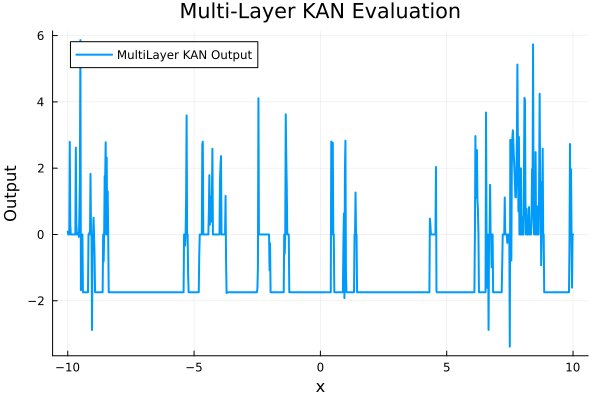

Input interval: (-0.2, 0.2)
Layer 1 output interval: (-3.5229046162932742, -0.7742116161558908)
Layer 2 output interval: (-581.9263619607422, 631.716692987562)
Layer 3 output interval: (-1363.7005795844043, 1369.6666431693645)
Layer 4 output interval: (-14.112088093451469, 14.208941709878905)
Final network output guaranteed to lie in: (-14.112088093451469, 14.208941709878905)


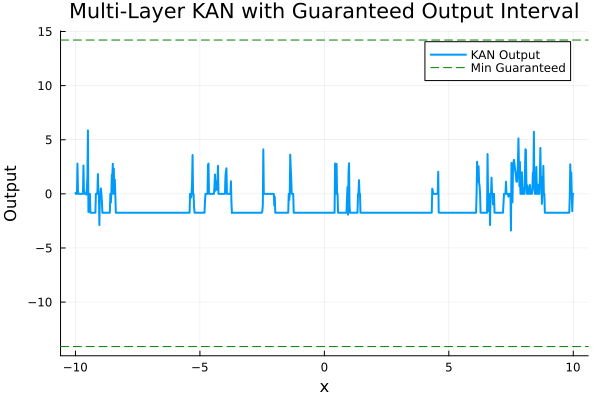

In [17]:
# Scaling Vanilla Interval Analysis
using LinearAlgebra
using Plots

# Here we define a helper so that an interval is given as (min, max)
function interval_analysis_spline_ordered(bs::BSpline, x_min::Float64, x_max::Float64)
    max_y, min_y = interval_analysis_spline(bs, x_min, x_max)
    return (min_y, max_y)
end

struct MultiLayerKAN
    layers::Vector{Vector{BSpline}}
end

function MultiLayerKAN(layersizes::Vector{Int}; lb::Float64=-10.0, ub::Float64=10.0, degree::Int=3)
    layers = Vector{Vector{BSpline}}()
    for nodes in layersizes
        push!(layers, [BSpline(lb, ub, degree) for _ in 1:nodes])
    end
    return MultiLayerKAN(layers)
end

function (kan::MultiLayerKAN)(x::Float64)
    current_input = x
    for layer in kan.layers
        outputs = [eval_spline(node, current_input) for node in layer]
        current_input = sum(outputs)
    end
    return current_input
end

function multilayer_kan_interval_analysis(kan::MultiLayerKAN, x_min::Float64, x_max::Float64)
    current_interval = (x_min, x_max)
    layer_intervals = Vector{Tuple{Float64, Float64}}()
    for (i, layer) in enumerate(kan.layers)
        node_intervals = [interval_analysis_spline_ordered(node, current_interval[1], current_interval[2]) for node in layer]
        layer_min = sum(interval[1] for interval in node_intervals)
        layer_max = sum(interval[2] for interval in node_intervals)
        push!(layer_intervals, (layer_min, layer_max))
        current_interval = (layer_min, layer_max)
    end
    return layer_intervals, current_interval
end

kan = MultiLayerKAN([10, 1000, 1000, 10])
x_range = LinRange(-10, 10, 1000)
y_vals = [kan(x) for x in x_range]
p1 = plot(x_range, y_vals, label="MultiLayer KAN Output", lw=2,
    title="Multi-Layer KAN Evaluation", xlabel="x", ylabel="Output")
display(p1)
x_interval = (-0.2, 0.2)
layer_intervals, final_interval = multilayer_kan_interval_analysis(kan, x_interval[1], x_interval[2])
println("Input interval: ", x_interval)
for (i, intvl) in enumerate(layer_intervals)
    println("Layer $i output interval: ", intvl)
end
println("Final network output guaranteed to lie in: ", final_interval)
p2 = plot(x_range, y_vals, label="KAN Output", lw=2,
    title="Multi-Layer KAN with Guaranteed Output Interval", xlabel="x", ylabel="Output")
hline!(p2, [final_interval[1], final_interval[2]], color=[:green :purple], linestyle=:dash,
    label=["Min Guaranteed" "Max Guaranteed"])
display(p2)

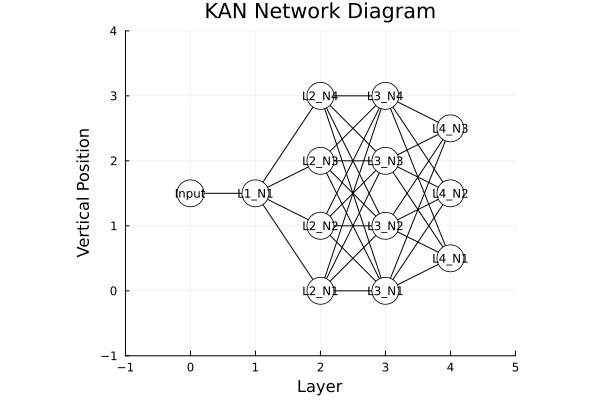

In [18]:
using Plots

function visualize_KAN_network(kan::MultiLayerKAN; node_radius=0.15)
    layers = []
    push!(layers, ["Input"])  # input layer (a single node)
    for (layer_idx, layer) in enumerate(kan.layers)
        num_nodes = length(layer)
        push!(layers, [ "L$(layer_idx)_N$(node_idx)" for node_idx in 1:num_nodes ])
    end
    n_layers = length(layers)
    x_coords = range(0, stop=n_layers - 1, length=n_layers)
    node_positions = Dict{String, Tuple{Float64,Float64}}()
    max_nodes = maximum(length.(layers))
    for (i, layer) in enumerate(layers)
        n_nodes = length(layer)
        offset = (max_nodes - n_nodes) / 2
        ys = [offset + j - 1 for j in 1:n_nodes]
        for (j, label) in enumerate(layer)
            node_positions[label] = (x_coords[i], ys[j])
        end
    end
    plt = plot(aspect_ratio=1, xlims=(-1, n_layers), 
               ylims=(-1, max_nodes), legend=false,
               title="KAN Network Diagram", xlabel="Layer", ylabel="Vertical Position")
    for i in 1:(n_layers - 1)
        for src in layers[i]
            for dst in layers[i+1]
                pos_src = node_positions[src]
                pos_dst = node_positions[dst]
                plot!(plt, [pos_src[1], pos_dst[1]], [pos_src[2], pos_dst[2]],
                      color=:black, lw=1, arrow=:none)
            end
        end
    end
    for (label, (x, y)) in node_positions
        scatter!(plt, [x], [y], markershape=:circle, markersize=15, color=:white, 
                 markerstrokecolor=:black, markerstrokealpha=1.0)
        annotate!(plt, x, y, text(label, 8, :center))
    end

    return plt
end

kan = MultiLayerKAN([1, 4, 4, 3])
plt_network = visualize_KAN_network(kan)
display(plt_network)

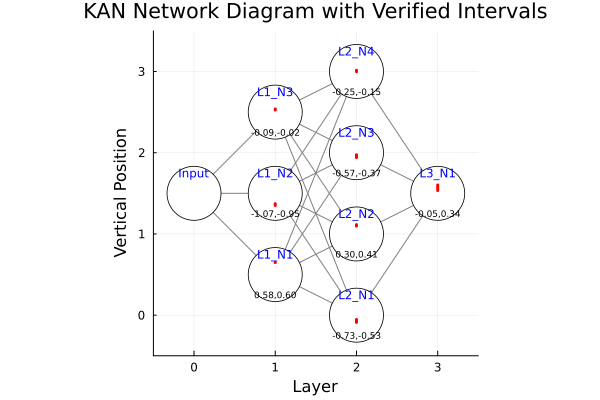

In [19]:
using Plots
using Printf
function interval_analysis_spline_ordered(bs::BSpline, x_min::Float64, x_max::Float64)
    max_y, min_y = interval_analysis_spline(bs, x_min, x_max)
    return (min_y, max_y)
end

function compute_neuron_intervals(kan::MultiLayerKAN, input_interval::Tuple{Float64,Float64})
    neuron_intervals = Dict{Tuple{Int,Int}, Tuple{Float64,Float64}}()
    layer_intervals = Dict{Int, Tuple{Float64,Float64}}()

    current_input_interval = input_interval
    for (layer_idx, layer) in enumerate(kan.layers)
        neuron_ints = [ interval_analysis_spline_ordered(node, current_input_interval[1], current_input_interval[2])
                        for node in layer ]
        for (node_idx, intvl) in enumerate(neuron_ints)
            neuron_intervals[(layer_idx, node_idx)] = intvl
        end
        layer_lower = sum(intvl[1] for intvl in neuron_ints)
        layer_upper = sum(intvl[2] for intvl in neuron_ints)
        layer_intervals[layer_idx] = (layer_lower, layer_upper)
        current_input_interval = (layer_lower, layer_upper)
    end
    return neuron_intervals, layer_intervals
end

function visualize_KAN_network_with_intervals(kan::MultiLayerKAN, input_interval::Tuple{Float64,Float64};
                                               node_radius=0.15)

    neuron_intervals, layer_intervals = compute_neuron_intervals(kan, input_interval)
    all_lowers = [intvl[1] for intvl in values(neuron_intervals)]
    all_uppers = [intvl[2] for intvl in values(neuron_intervals)]
    global_min = minimum(all_lowers)
    global_max = maximum(all_uppers)
    global_range = global_max - global_min
    if global_range == 0.0
        global_range = 1.0  # avoid division by zero
    end
    layers_labels = []
    push!(layers_labels, ["Input"])
    for (layer_idx, layer) in enumerate(kan.layers)
        n_nodes = length(layer)
        push!(layers_labels, [ "L$(layer_idx)_N$(node_idx)" for node_idx in 1:n_nodes ])
    end
    n_layers = length(layers_labels)
    x_coords = collect(range(0, stop=n_layers-1, length=n_layers))
    max_nodes = maximum(length.(layers_labels))
    node_positions = Dict{String, Tuple{Float64,Float64}}()
    neuron_label = Dict{Tuple{Int,Int}, String}()
    for (i, layer) in enumerate(layers_labels)
        n_nodes = length(layer)
        offset = (max_nodes - n_nodes)/2
        for (j, label) in enumerate(layer)
            node_positions[label] = (x_coords[i], offset + j - 1)
            if i > 1 
                neuron_label[(i-1, j)] = label
            end
        end
    end
    plt = plot(aspect_ratio=1, xlims=(-0.5, n_layers-0.5), ylims=(-0.5, max_nodes-0.5),
               legend=false, title="KAN Network Diagram with Verified Intervals",
               xlabel="Layer", ylabel="Vertical Position")
    for i in 1:(n_layers-1)
        for src in layers_labels[i]
            for dst in layers_labels[i+1]
                pos_src = node_positions[src]
                pos_dst = node_positions[dst]
                plot!(plt, [pos_src[1], pos_dst[1]], [pos_src[2], pos_dst[2]],
                      color=:gray, lw=1)
            end
        end
    end
    for (label, (x, y)) in node_positions
        scatter!(plt, [x], [y],
                 markershape=:circle, markersize=30,
                 markercolor=:white, markerstrokecolor=:black, markerstrokealpha=1.0)
        if label != "Input"
            m = match(r"L(\d+)_N(\d+)", label)
            if m !== nothing
                layer_idx = parse(Int, m.captures[1])
                neuron_idx = parse(Int, m.captures[2])
                intvl = neuron_intervals[(layer_idx, neuron_idx)]
                norm_lower = (intvl[1] - global_min) / global_range
                norm_upper = (intvl[2] - global_min) / global_range
                y_low = y - node_radius + 2 * node_radius * norm_lower
                y_high = y - node_radius + 2 * node_radius * norm_upper
                plot!(plt, [x, x], [y_low, y_high],
                      color=:red, lw=3)
                annot_text = @sprintf("%.2f,%.2f", intvl[1], intvl[2])
                annotate!(plt, x, y - node_radius - 0.1, text(annot_text, 6, :center, :black))
            end
        end
        annotate!(plt, x, y + node_radius + 0.1, text(label, 8, :center, :blue))
    end

    return plt
end
kan = MultiLayerKAN([3, 4, 1])
input_interval = (-0.1, 0.1)
plt_detailed = visualize_KAN_network_with_intervals(kan, input_interval; node_radius=0.15)
display(plt_detailed)